In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('../')

import pandas as pd
import scanpy as sc
import anndata
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from coral import utils_simu
#import utils_simu
truncated_codex = sc.read_h5ad('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/coral_results/simulation/truncated_mop_cluster.h5ad')
truncated_codex.obs['cluster'] = truncated_codex.obs['leiden'] 

In [2]:
truncated_codex

AnnData object with n_obs × n_vars = 940 × 50
    obs: 'sample_id', 'slice_id', 'class_label', 'subclass', 'label', 'X', 'Y', 'n_counts', 'cell_type', 'type', 'region', 'leiden', 'cluster'
    var: 'n_cells'
    uns: 'leiden', 'log1p', 'neighbors', 'pca', 'subclass_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [3]:
visium_res1 = sc.read_h5ad('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/coral_results/simulation/coral_mop_data1.h5ad')
visium_res2 = sc.read_h5ad('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/coral_results/simulation/coral_mop_data2.h5ad')
visium_res3 = sc.read_h5ad('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/coral_results/simulation/coral_mop_data3_new.h5ad')
visium_res4 = sc.read_h5ad('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/coral_results/simulation/coral_mop_data4.h5ad')


covet_data = sc.read_h5ad('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/coral_results/simulation/covet_mop_cluster.h5ad')
spatialglue_data = sc.read_h5ad('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/coral_results/simulation/spatialglue_mop_cluster.h5ad')


In [4]:
visium_res1

AnnData object with n_obs × n_vars = 940 × 50
    obs: 'leiden', 'cluster'
    uns: 'leiden', 'neighbors'
    obsm: 'cell_types', 'codex_true', 'coral', 'generated_expr', 'spatial', 'v_values', 'visium_true'
    obsp: 'connectivities', 'distances'

In [5]:
truncated_codex

AnnData object with n_obs × n_vars = 940 × 50
    obs: 'sample_id', 'slice_id', 'class_label', 'subclass', 'label', 'X', 'Y', 'n_counts', 'cell_type', 'type', 'region', 'leiden', 'cluster'
    var: 'n_cells'
    uns: 'leiden', 'log1p', 'neighbors', 'pca', 'subclass_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

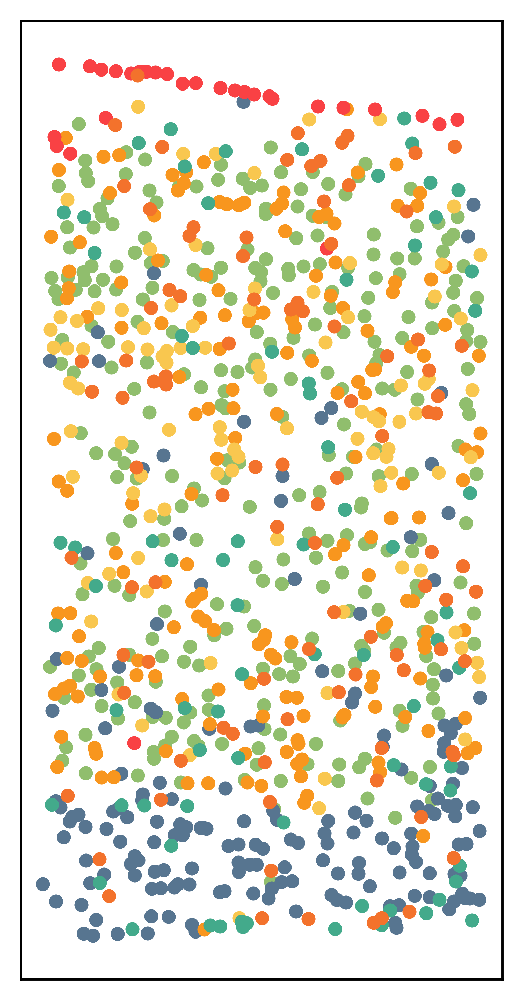

In [21]:
utils_simu.plot_cluster(truncated_codex,
                               size =15,
                               color_list = [
                                    '#90be6d', # green
                                    '#577590',  # dark blue
                                    
                                    '#f8961e',  # orange
                                    '#f9c74f', # yellow
                                    '#f94144', # red
                                    '#43aa8b', # dark green 
                                    '#f3722c', # red orange 
                                    #'#226CE0',
                                    #'#77479F'

                               ],            
                               #legd = True,
                               return_ = True,
                              )

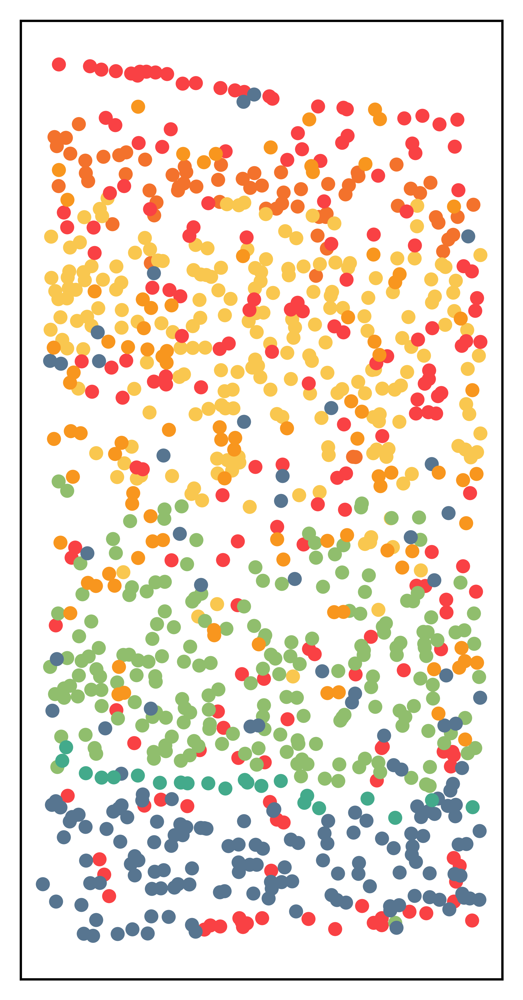

In [22]:
utils_simu.plot_cluster(visium_res1,
                       size =15,
                       color_list = [
                            '#f3722c', # red orange 
                            '#f9c74f', # yellow

                            '#f94144', # red
                            '#90be6d', # green
                            '#577590',  # dark blue
                            
                            '#f8961e',  # orange
                           '#43aa8b', # dark green 
                            #'#226CE0',
                            #'#77479F'

                               ],            
                               #legd = True,
                               return_ = True,
                              )

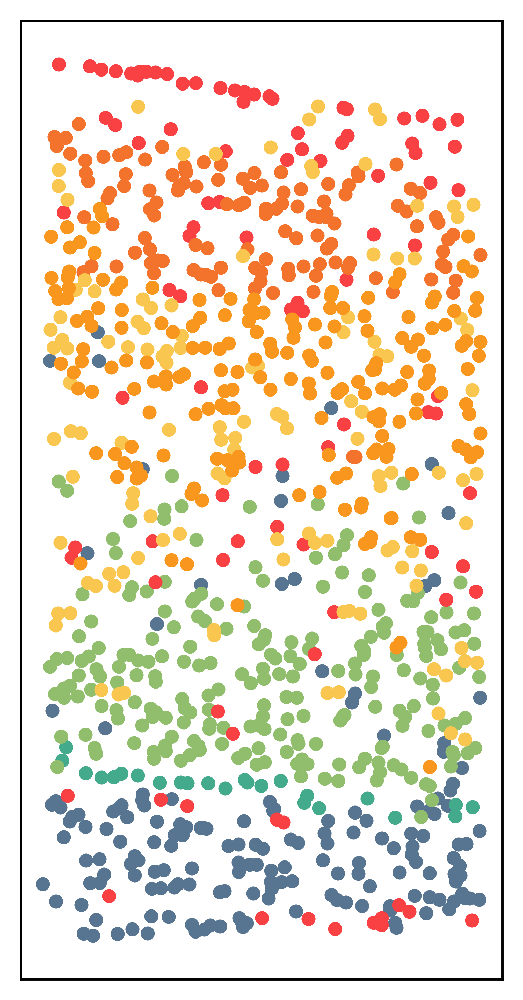

In [23]:
utils_simu.plot_cluster(visium_res2,
                       size =15,
                       color_list = [
                            '#577590',  # dark blue 
                            '#43aa8b', # dark green 
                            '#90be6d', # green
                            '#f94144', # red
                            
                            '#f3722c', # red orange 
                            '#f9c74f', # yellow
                            '#f8961e',  # orange
                           
                            #'#226CE0',
                            #'#77479F'

                               ],            
                               #legd = True,
                               return_ = True,
                              )

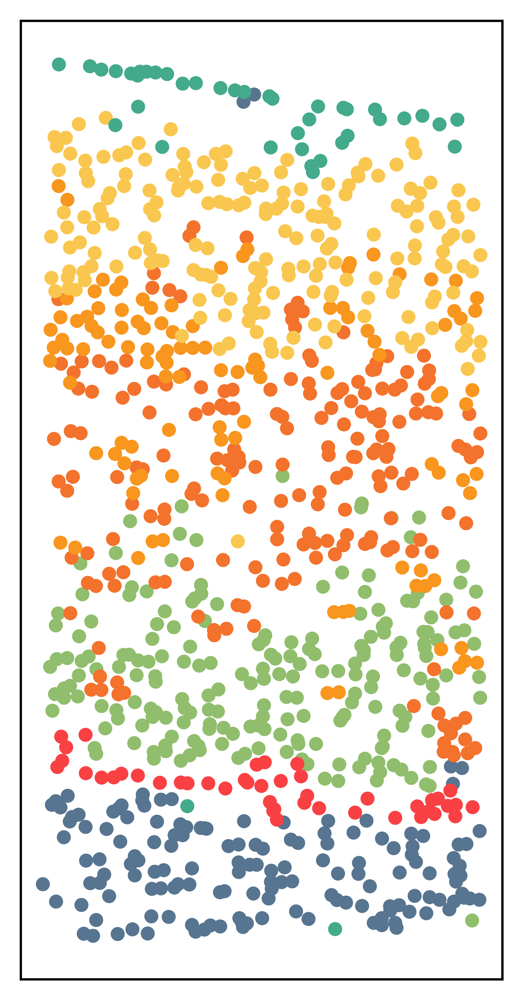

In [24]:
utils_simu.plot_cluster(visium_res3,
                       size =15,
                       color_list = [
                           '#90be6d', # green
                            '#577590',  # dark blue 
                           
                            
                            '#f3722c', # red orange 
                           
                          
                           '#f8961e',  # orange
                            '#f94144', # red
                            
                             '#f9c74f', # yellow
                            
                            '#43aa8b', # dark green 
                            #'#226CE0',
                            #'#77479F'

                               ],            
                               #legd = True,
                               return_ = True,
                              )

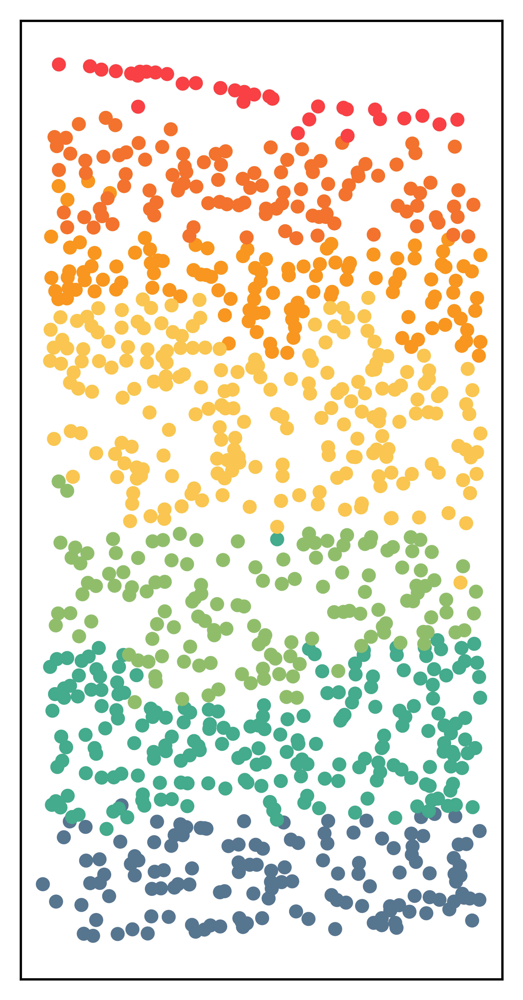

In [25]:
utils_simu.plot_cluster(visium_res4,
                       size =15,
                       color_list = [
                            '#577590',  # dark blue 
                            '#43aa8b', # dark green 
                            
                            '#f8961e',  # orange
                           '#f9c74f', # yellow
                           '#90be6d', # green
                            
                            '#f3722c', # red orange 
                            
                            
                           '#f94144', # red
                            #'#226CE0',
                            #'#77479F'

                               ],            
                               #legd = True,
                               return_ = True,
                              )

In [6]:
from scipy.spatial import cKDTree
def reindex_adata_qz(adata: anndata.AnnData, adata_qz: anndata.AnnData) -> anndata.AnnData:
    """
    Reindex adata_qz to match the order of adata based on spatial coordinates.

    Parameters:
    - adata: AnnData object containing the reference spatial coordinates.
    - adata_qz: AnnData object to be reindexed based on spatial coordinates.

    Returns:
    - adata_qz_reindexed: Reindexed AnnData object.
    """

    # Extract spatial coordinates
    spatial_coords_adata = adata.obsm['spatial']
    spatial_coords_adata_qz = adata_qz.obsm['spatial']

    # Find nearest neighbors
    tree = cKDTree(spatial_coords_adata_qz)
    distances, indices = tree.query(spatial_coords_adata)

    # Reindex adata_qz
    adata_qz_reindexed = adata_qz[indices].copy()
    adata_qz_reindexed.obs.index = adata.obs.index

    return adata_qz_reindexed

visium_res1 = reindex_adata_qz(truncated_codex, visium_res1)
visium_res2 = reindex_adata_qz(truncated_codex, visium_res2)
visium_res3 = reindex_adata_qz(truncated_codex, visium_res3)
visium_res4 = reindex_adata_qz(truncated_codex, visium_res4)

covet_data = reindex_adata_qz(truncated_codex, covet_data)
spatialglue_data = reindex_adata_qz(truncated_codex, spatialglue_data)


In [7]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, homogeneity_completeness_v_measure, mutual_info_score, confusion_matrix
from scipy.optimize import linear_sum_assignment
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


def remap_labels(labels, n_labels=7):
    unique_labels = np.unique(labels)
    label_mapping = {old_label: new_label for new_label, old_label in enumerate(unique_labels[:n_labels])}
    remapped_labels = labels.map(label_mapping)
    return remapped_labels

adata_list = [visium_res1, visium_res2, visium_res3, visium_res4, covet_data, spatialglue_data, truncated_codex]
clusters = {}
for i, adata in enumerate(adata_list):
    clusters[f'data_{i+1}_cluster'] = remap_labels(adata.obs['cluster'])

    
# Ground truth regions
true_labels = remap_labels(truncated_codex.obs['region'])


In [8]:
from sklearn.metrics import (
    confusion_matrix, adjusted_rand_score, normalized_mutual_info_score,
    adjusted_mutual_info_score, mutual_info_score, homogeneity_completeness_v_measure
)
n_bootstrap = 100

bootstrapped_metrics = {metric: {name: [] for name in clusters} for metric in [
    'Homogeneity', 'Mutual Information', 'V-measure', 'AMI', 'NMI', 'ARI']}
# Loop through clustering methods
for name, cluster_labels in clusters.items():
    for _ in range(n_bootstrap):
        # Bootstrap resampling
        indices = np.random.choice(len(true_labels), size=len(true_labels), replace=True)
        true_resampled = true_labels.iloc[indices]
        predicted_resampled = cluster_labels.iloc[indices]

        # Compute the confusion matrix for the resampled data
        initial_conf_matrix = confusion_matrix(true_resampled, predicted_resampled)

        # Align predicted labels to maximize overlap with true labels
        row_to_col_mapping = {}
        remaining_rows = list(range(initial_conf_matrix.shape[0]))
        remaining_cols = list(range(initial_conf_matrix.shape[1]))

        while remaining_rows and remaining_cols:
            max_value = -1
            max_row, max_col = -1, -1
            for row in remaining_rows:
                for col in remaining_cols:
                    if initial_conf_matrix[row, col] > max_value:
                        max_value = initial_conf_matrix[row, col]
                        max_row = row
                        max_col = col

            row_to_col_mapping[max_row] = max_col
            remaining_rows.remove(max_row)
            remaining_cols.remove(max_col)

        # Align cluster labels
        aligned_cluster_labels = predicted_resampled.map(lambda x: {v: k for k, v in row_to_col_mapping.items()}.get(x, x))

        # Calculate metrics for resampled and aligned labels
        ari = adjusted_rand_score(true_resampled, aligned_cluster_labels)
        ami = adjusted_mutual_info_score(true_resampled, aligned_cluster_labels)
        nmi = normalized_mutual_info_score(true_resampled, aligned_cluster_labels)
        mi = mutual_info_score(true_resampled, aligned_cluster_labels)
        homogeneity, completeness, v_measure = homogeneity_completeness_v_measure(true_resampled, aligned_cluster_labels)

        # Append metrics for this bootstrap iteration to the updated structure
        bootstrapped_metrics['Homogeneity'][name].append(homogeneity)
        bootstrapped_metrics['NMI'][name].append(nmi)
        bootstrapped_metrics['AMI'][name].append(ami)
        bootstrapped_metrics['V-measure'][name].append(v_measure)
        bootstrapped_metrics['Mutual Information'][name].append(mi)
        bootstrapped_metrics['ARI'][name].append(ari)

    
# Aggregate results (mean and standard deviation)
aggregated_metrics = {
    name: {metric: (np.mean(scores), np.std(scores)) for metric, scores in metrics.items()}
    for name, metrics in bootstrapped_metrics.items()
}
# Convert aggregated metrics to a DataFrame for visualization
metrics_summary = []
for name, metrics in aggregated_metrics.items():
    for metric, (mean, std) in metrics.items():
        metrics_summary.append({'Method': name, 'Metric': metric, 'Mean': mean, 'Std': std})

metrics_df = pd.DataFrame(metrics_summary)

In [12]:
bootstrapped_scores_df

,Method,Metric,Score
0,Homogeneity,data_1_cluster,0.449043
1,Homogeneity,data_1_cluster,0.455100
2,Homogeneity,data_1_cluster,0.458388
3,Homogeneity,data_1_cluster,0.427207
4,Homogeneity,data_1_cluster,0.448274
...,...,...,...
4195,ARI,data_7_cluster,0.109320
4196,ARI,data_7_cluster,0.113660
4197,ARI,data_7_cluster,0.116127
4198,ARI,data_7_cluster,0.131487


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

NMI_data_4_cluster vs. NMI_data_5_cluster: t-test independent samples, P_val:1.479e-17 t=9.389e+00
ARI_data_4_cluster vs. ARI_data_5_cluster: t-test independent samples, P_val:4.892e-03 t=2.846e+00
Homogeneity_data_4_cluster vs. Homogeneity_data_5_cluster: t-test independent samples, P_val:5.299e-26 t=1.224e+01
Mutual Information_data_4_cluster vs. Mutual Information_data_5_cluster: t-test independent samples, P_val:9.552e-23 t=1.116e+01
V-measure_data_4_cluster vs. V-measure_data_5_cluster: t-test independent samples, P_val:1.479e-17 t=9.389e+00
AMI_data_4_cluster vs. AMI_data_5_cluster: t-test independent samples, P_val:1.385e-17 t=9.399e+00


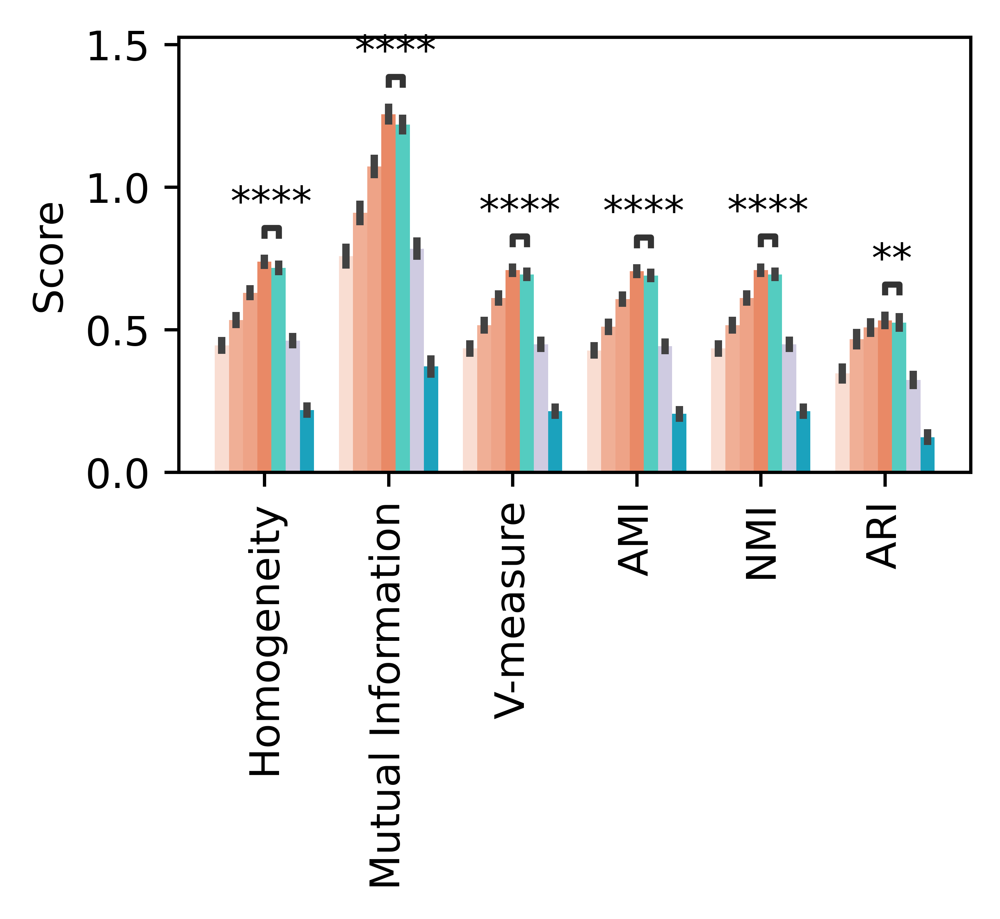

In [19]:
import matplotlib as mpl
from scipy.stats import f_oneway
def calculate_anova_for_metrics(bootstrapped_scores, methods_label):
    """
    Perform ANOVA for each metric across all methods.

    Parameters:
    - bootstrapped_scores: Nested dictionary with bootstrapped scores for each metric and method.
    - methods_label: List of method names.

    Returns:
    - anova_results: Dictionary with metric as key and (F-statistic, p-value) as value.
    """
    anova_results = {}
    for metric, method_scores in bootstrapped_scores.items():
        # Collect scores for this metric across all methods
        metric_data = [method_scores[method] for method in methods_label]
        
        # Perform ANOVA
        f_stat, p_val = f_oneway(*metric_data)
        anova_results[metric] = (f_stat, p_val)
    return anova_results


# Set the font family to DejaVuSans or another font with full sentence support
mpl.rcParams['pdf.fonttype'] = 42  # Ensures text is stored as Type 3 font (OpenType)
mpl.rcParams['ps.fonttype'] = 42  # PostScript font type for compatibility

bootstrapped_scores_long = []

for metric, methods in bootstrapped_metrics.items():
    for method, scores in methods.items():
        bootstrapped_scores_long.extend([
            {'Method': metric, 'Metric': method, 'Score': score} for score in scores
        ])

bootstrapped_scores_df = pd.DataFrame(bootstrapped_scores_long)
custom_colors = ['#ffdacc',
                 '#ffa887',
                 '#ff9b76',
                 '#FF7F50', 
                 '#40e0d0', 
                 '#cdc7e5', 
                 '#00b4d8']  # Example colors

custom_palette = dict(zip(['data_1_cluster', 'data_2_cluster', 'data_3_cluster',
       'data_4_cluster', 'data_5_cluster', 'data_6_cluster',
       'data_7_cluster'], custom_colors))

# Plot using Seaborn
plt.figure(figsize=(3.5,3.2), dpi=800)
g1=sns.barplot(
    x='Method', y='Score', hue='Metric', data=bootstrapped_scores_df, 
    palette=custom_palette, errorbar='sd',
    err_kws={'linewidth': 1.8}
)



metric_label =['Homogeneity', 'Mutual Information', 'V-measure', 'AMI', 'NMI',
       'ARI']
methods_label = ['data_1_cluster', 'data_2_cluster', 'data_3_cluster',
       'data_4_cluster', 'data_5_cluster', 'data_6_cluster',
       'data_7_cluster']
anova_results = calculate_anova_for_metrics(bootstrapped_metrics, methods_label)


from statannotations.Annotator import Annotator

#plt.ylim([0.,1.1])

plt.xlabel('')
box_pairs = [
              #('Dataset 1', 'Dataset 6'),
   # ('Dataset 2', 'Dataset 6'),
   # ('Dataset 3', 'Dataset 6'),
   # ('Dataset 4', 'Dataset 6'),
    (('Homogeneity','data_4_cluster'),('Homogeneity','data_5_cluster')),
    (('Mutual Information','data_4_cluster'),('Mutual Information','data_5_cluster')),
    (('V-measure','data_4_cluster'),('V-measure','data_5_cluster')),
    (('AMI','data_4_cluster'),('AMI','data_5_cluster')),
    (('NMI','data_4_cluster'),('NMI','data_5_cluster')),
    (('ARI','data_4_cluster'),('ARI','data_5_cluster')),
            ]

annot = Annotator(g1, box_pairs, data=bootstrapped_scores_df, x='Method', y='Score',hue='Metric',)
annot.configure(test='t-test_ind', verbose=2,text_format='star')
annot.apply_test(#equal_var=False,
                 #alternative='greater'
                )
annot.annotate()

plt.xlabel('')
plt.ylabel('Score')
g1.get_legend().remove()
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('../figure/fig2b.pdf',dpi=600)

In [68]:
anova_results

{'Homogeneity': (16913.466165284506, 0.0),
 'Mutual Information': (13822.20650048301, 0.0),
 'V-measure': (16063.058781640755, 0.0),
 'AMI': (16048.410916878336, 0.0),
 'NMI': (16063.058781640755, 0.0),
 'ARI': (6095.351138920442, 0.0)}

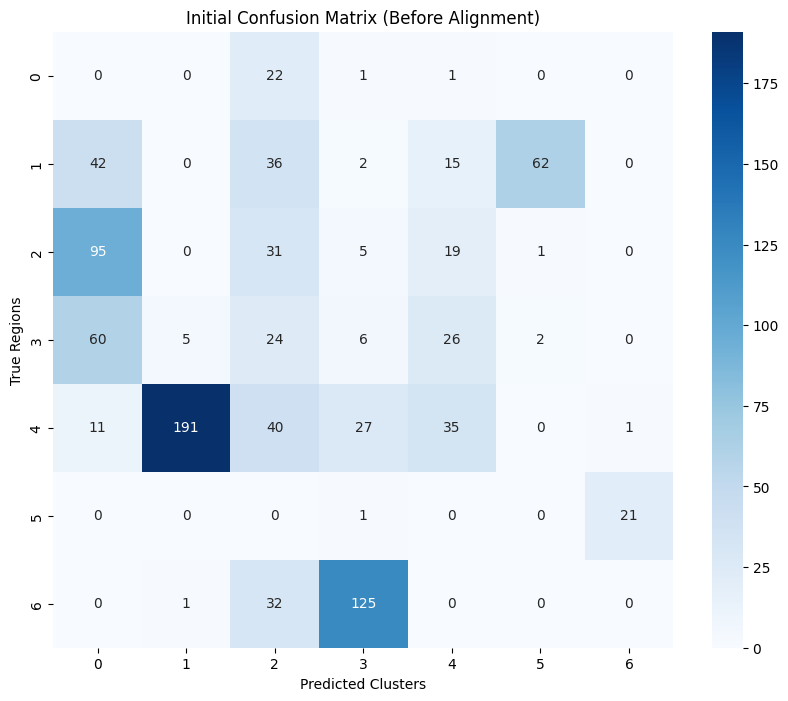

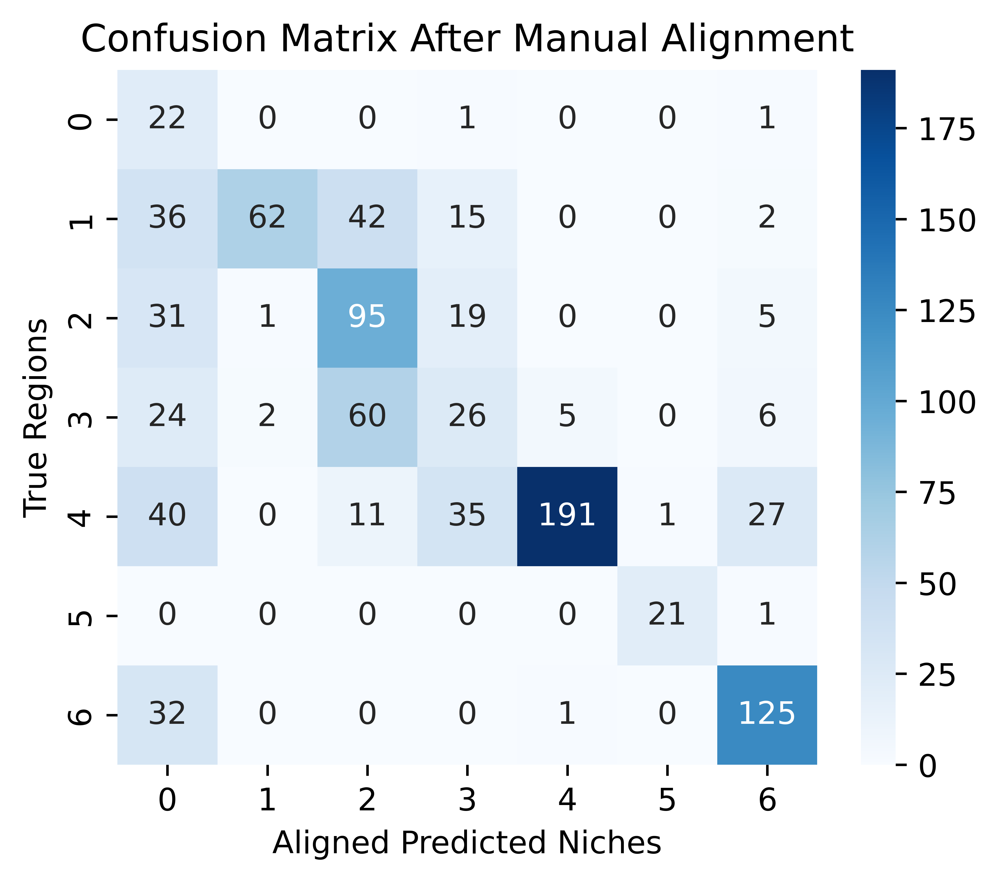

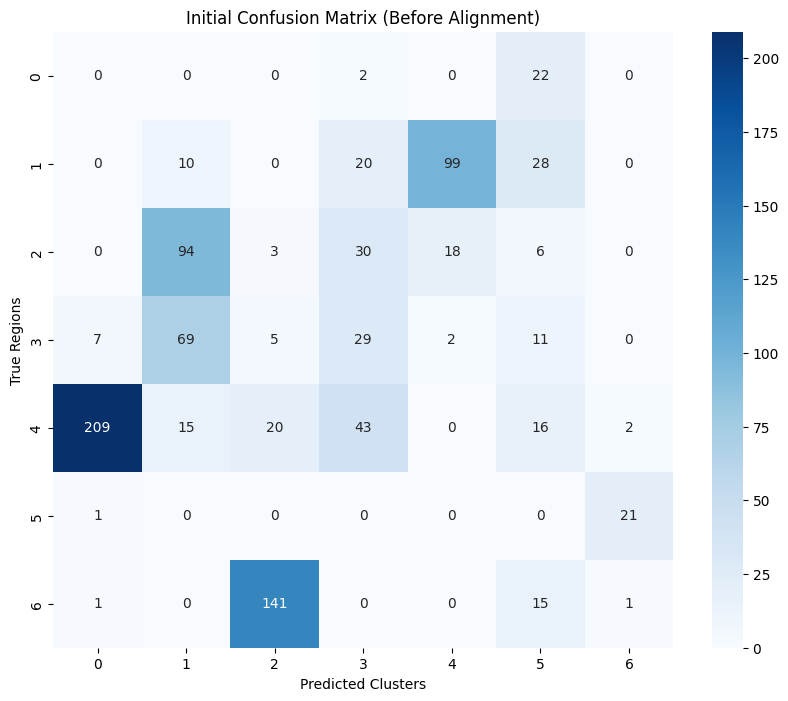

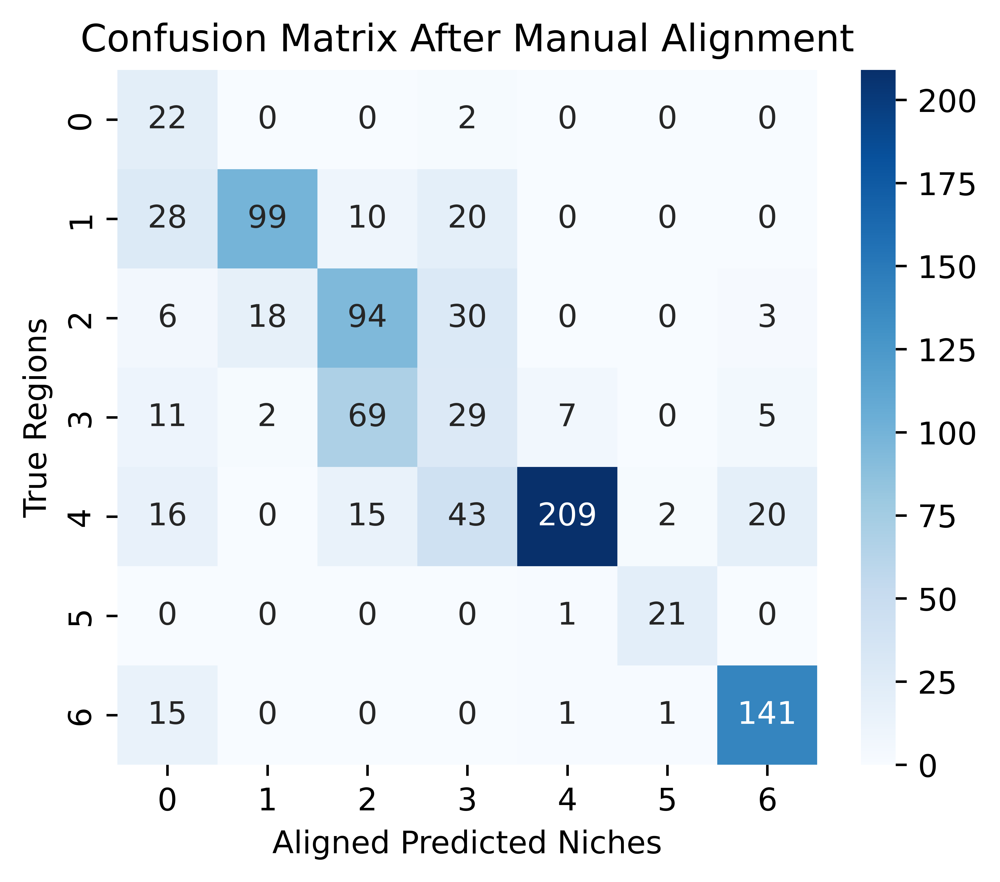

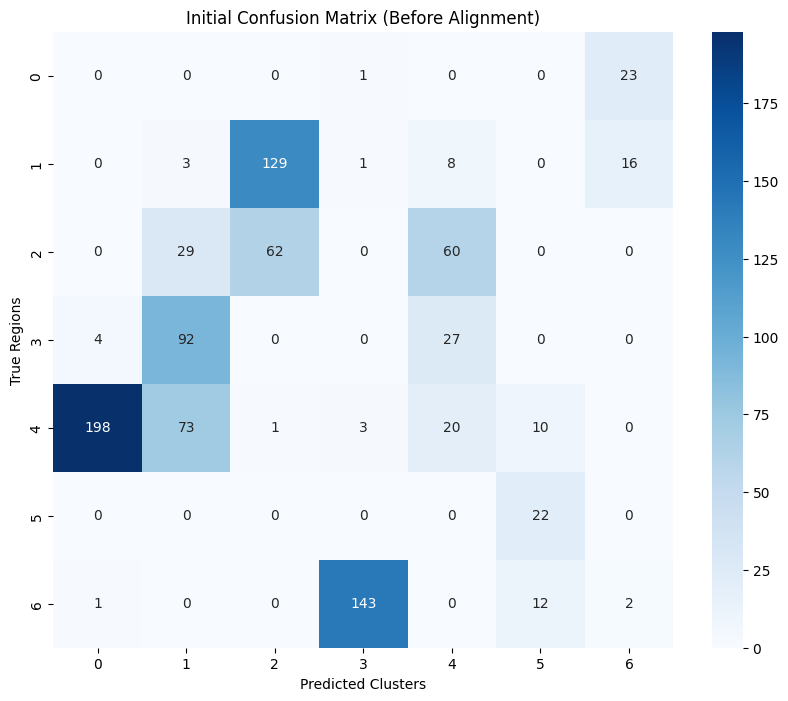

...

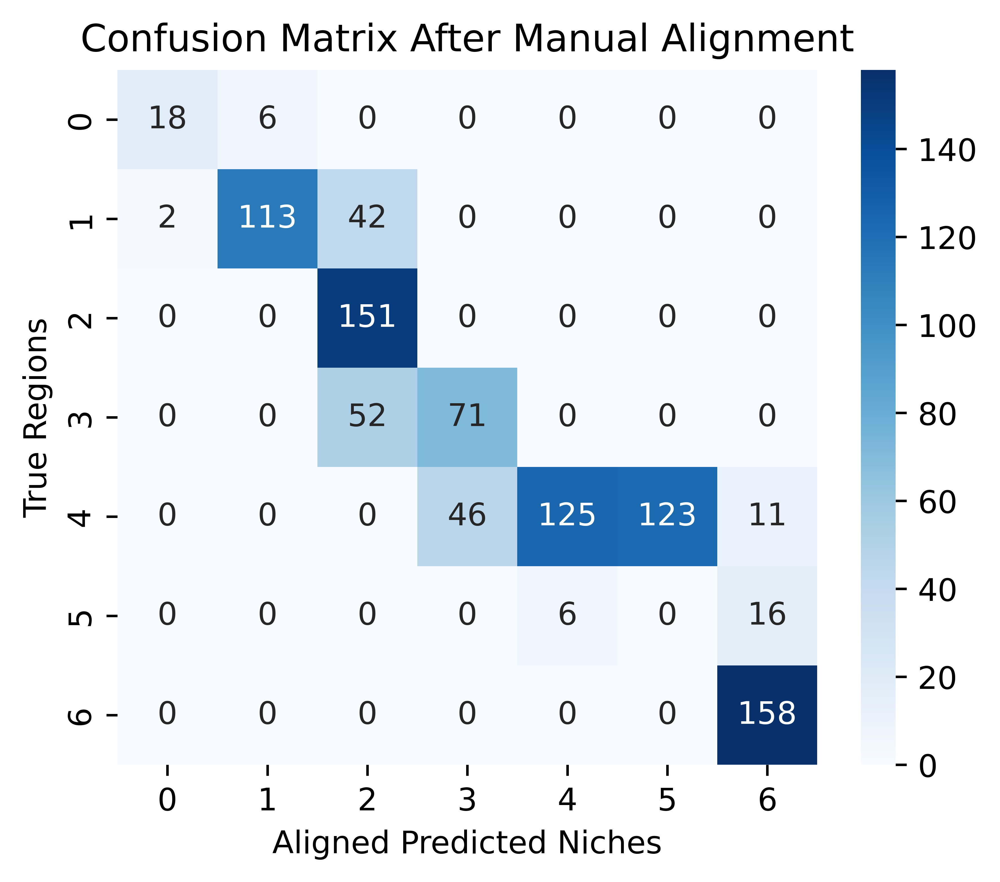

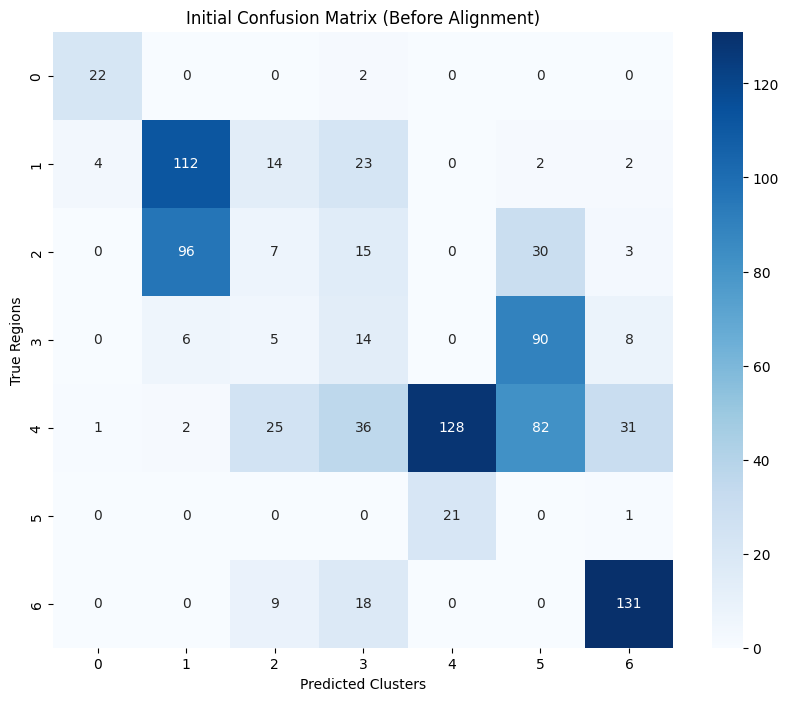

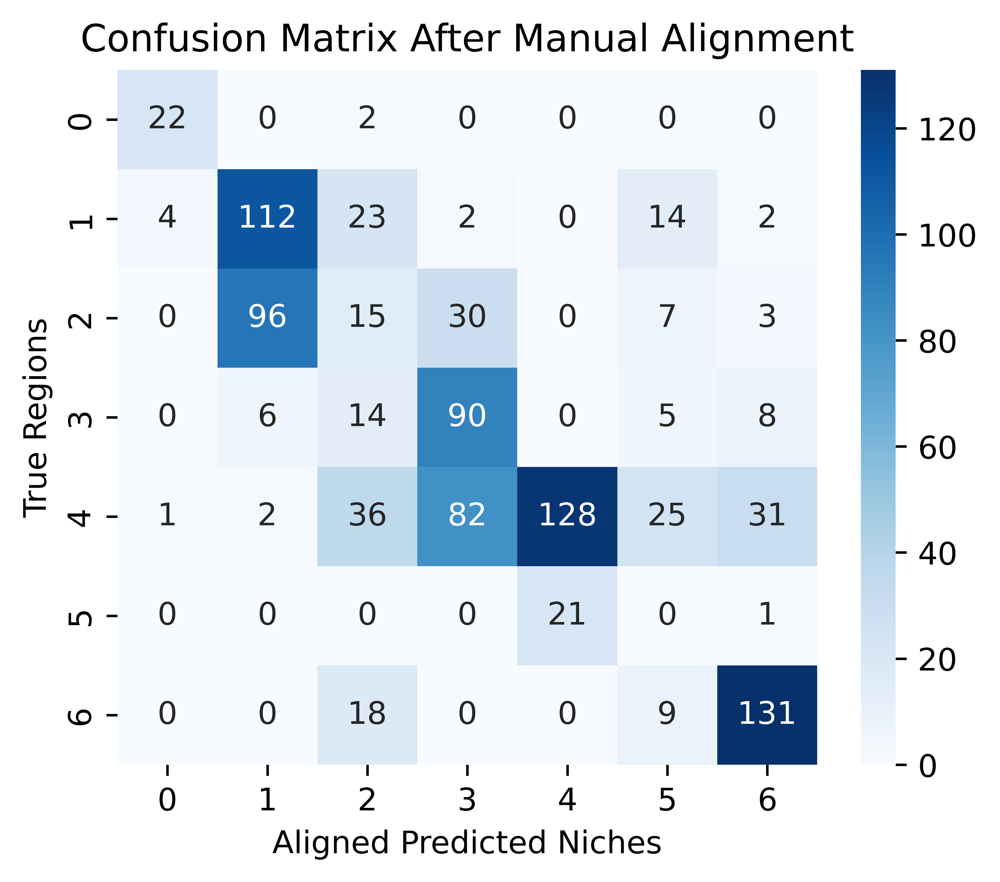

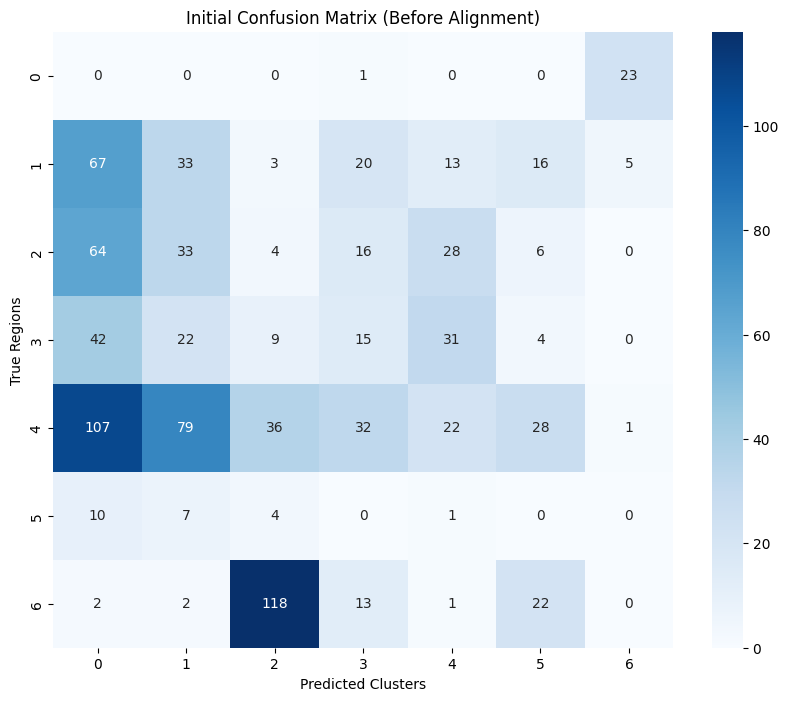

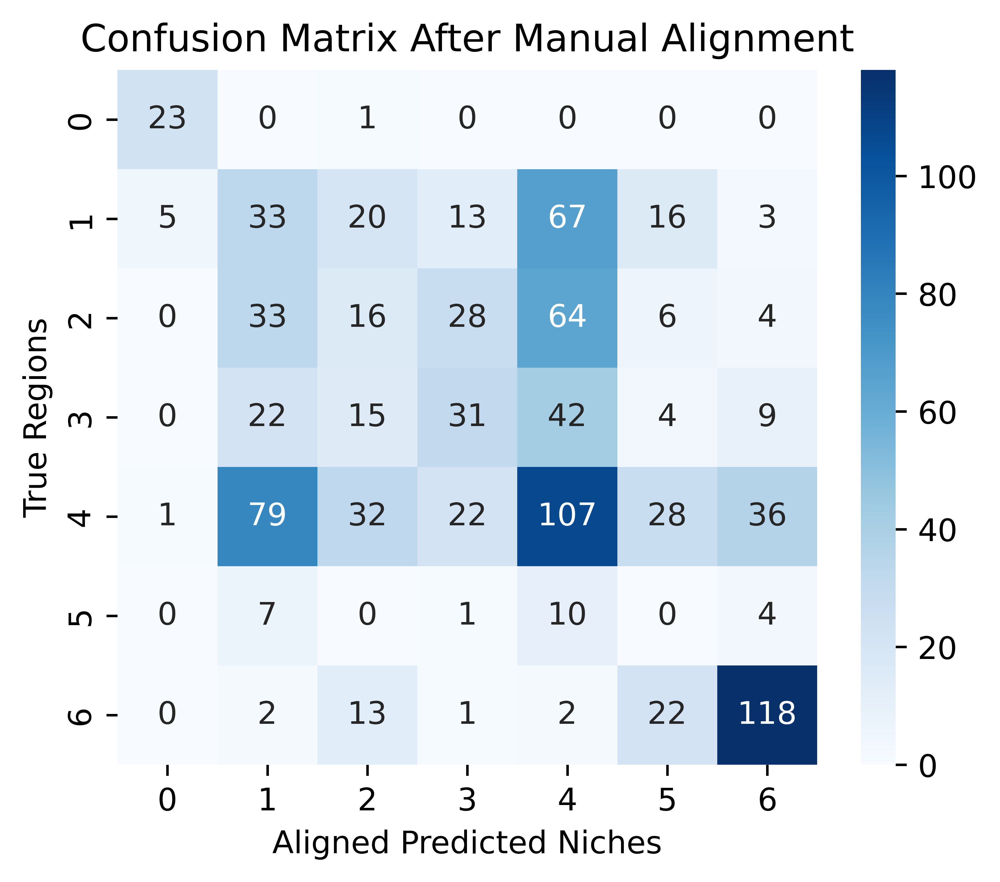

In [11]:

metrics_dict = {name: {'Homogeneity': 0, 
                       
                       'Mutual Information': 0, 
                       
                       'V-measure': 0, 
                       
                       'AMI': 0, 
                       'NMI': 0, 
                       'ARI': 0} for name in clusters}


for name, cluster_labels in clusters.items():
    # Compute the confusion matrix
    initial_conf_matrix = confusion_matrix(true_labels, cluster_labels)

    # Visualize the initial confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(initial_conf_matrix, annot=True, cmap='Blues', fmt='d')
    plt.title("Initial Confusion Matrix (Before Alignment)")
    plt.xlabel("Predicted Clusters")
    plt.ylabel("True Regions")
    plt.show()

    # Initialize mappings
    row_to_col_mapping = {}
    remaining_rows = list(range(initial_conf_matrix.shape[0]))
    remaining_cols = list(range(initial_conf_matrix.shape[1]))

    # Iteratively find and map the largest overlap
    while remaining_rows and remaining_cols:
        max_value = -1
        max_row, max_col = -1, -1

        # Find the maximum value in the confusion matrix
        for row in remaining_rows:
            for col in remaining_cols:
                if initial_conf_matrix[row, col] > max_value:
                    max_value = initial_conf_matrix[row, col]
                    max_row = row
                    max_col = col

        # Map the row (true region) to the col (predicted cluster)
        row_to_col_mapping[max_row] = max_col

        # Remove the matched row and column from further consideration
        remaining_rows.remove(max_row)
        remaining_cols.remove(max_col)
    
    aligned_cluster_labels = cluster_labels.map(lambda x: {v: k for k, v in row_to_col_mapping.items()}.get(x, x))

    # Recompute the confusion matrix with the manually aligned labels
    aligned_conf_matrix = confusion_matrix(true_labels, aligned_cluster_labels)

    # Visualize the new confusion matrix after manual alignment
    plt.figure(figsize=(5, 4),dpi=800)
    sns.heatmap(aligned_conf_matrix, annot=True, cmap='Blues', fmt='d')
    plt.title("Confusion Matrix After Manual Alignment")
    plt.xlabel("Aligned Predicted Niches")
    plt.ylabel("True Regions")
    plt.show()
    
    ari = adjusted_rand_score(true_labels, aligned_cluster_labels)
    ami = adjusted_rand_score(true_labels, cluster_labels)
    nmi = normalized_mutual_info_score(true_labels, aligned_cluster_labels)
    mi = mutual_info_score(true_labels, aligned_cluster_labels)
    homogeneity, completeness, v_measure = homogeneity_completeness_v_measure(true_labels, aligned_cluster_labels)

    metrics_dict[name]['Homogeneity'] = homogeneity
    metrics_dict[name]['NMI'] = nmi
    metrics_dict[name]['AMI'] = ami
    metrics_dict[name]['V-measure'] = v_measure
    metrics_dict[name]['Mutual Information'] = mi
    metrics_dict[name]['ARI'] = ari


In [12]:
# Convert the metrics dictionary to a DataFrame for plotting
metric_scores = pd.DataFrame(metrics_dict)

# Convert the DataFrame into a long format for seaborn
metric_scores_long = metric_scores.reset_index().melt(id_vars='index', var_name='Method', value_name='Score')
metric_scores_long.rename(columns={'index': 'Metric'}, inplace=True)



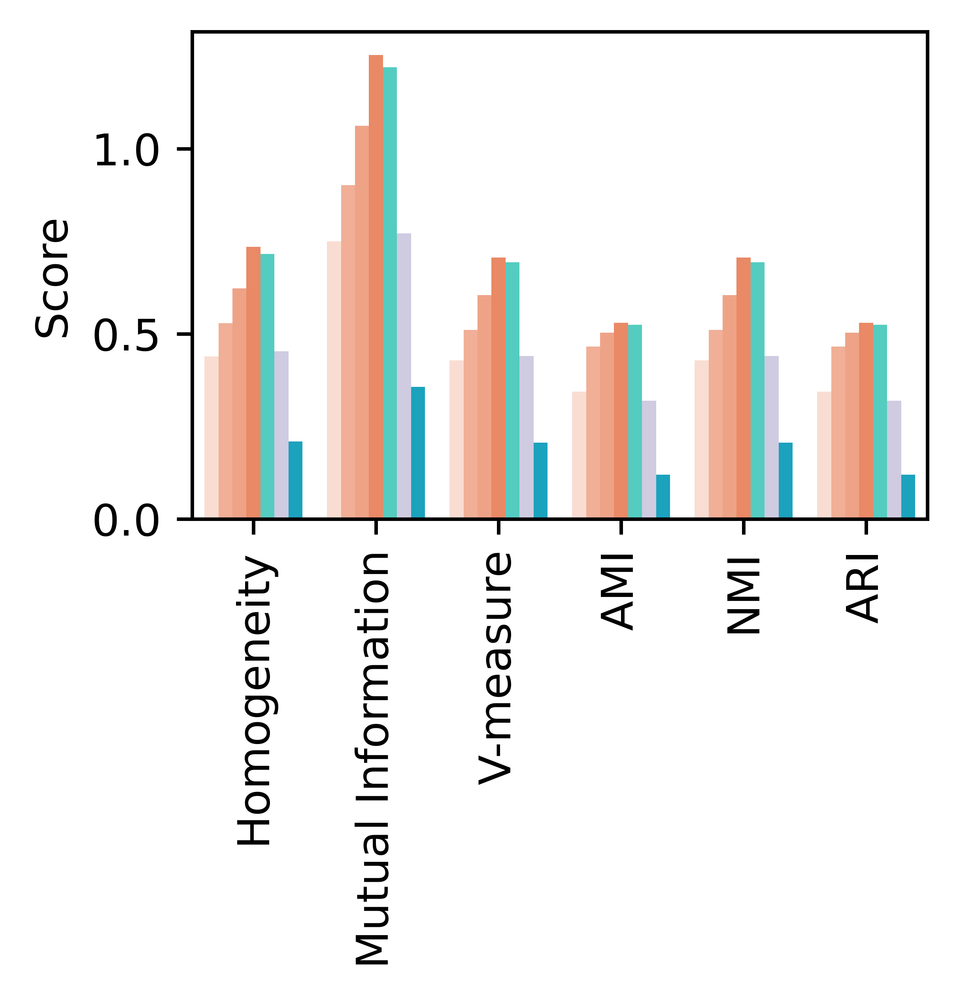

In [30]:
# Define custom colors for the different methods
custom_colors = ['#ffdacc',
                 '#ffa887',
                 '#ff9b76',
                 '#FF7F50', 
                 '#40e0d0', 
                 '#cdc7e5', 
                 '#00b4d8']  # Example colors

# Create a custom color palette dictionary
custom_palette = dict(zip(metric_scores.columns, custom_colors))

# Plot the bar plot using seaborn
plt.figure(figsize=(3,2),dpi=800)
sns.barplot(x='Metric', y='Score', hue='Method', data=metric_scores_long, palette=custom_palette)

plt.xlabel('')
plt.ylabel('Score')
#plt.legend(title='Method', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.legend([], [], frameon=False)

plt.xticks(rotation=90)
plt.show()

In [33]:
sc_adata = sc.read_h5ad('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/spatial_scope_data/simulate_01/merfish_data.h5ad')


(0.0, 10.0)

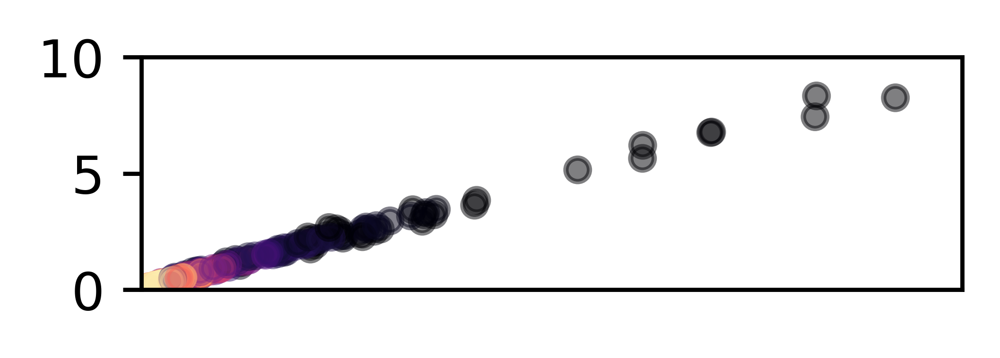

In [34]:
from scipy.stats import gaussian_kde
df_true_sample = pd.DataFrame(visium_res1.obsm['generated_expr'].mean(axis=0))
df_pred_sample = pd.DataFrame(sc_adata.X.mean(axis=0))

plt.figure(figsize=(2.8,0.8),dpi=800)
ax = plt.gca()

xx = df_true_sample.T.to_numpy().flatten()
yy = df_pred_sample.T.to_numpy().flatten()


for gene in df_true_sample.columns:
    try:
        gene_true = df_true_sample[gene].values
        gene_pred = df_pred_sample[gene].values
        gexp_stacked = np.vstack([df_true_sample[gene].values, df_pred_sample[gene].values])

        z = gaussian_kde(gexp_stacked)(gexp_stacked)
        ax.scatter(gene_true, gene_pred, c=z, s=20, alpha=0.5,cmap='magma')
    except np.linalg.LinAlgError as e:
        pass
plt.xticks([])
plt.xlim([0,16])    
plt.ylim([0,10])  

(0.0, 10.0)

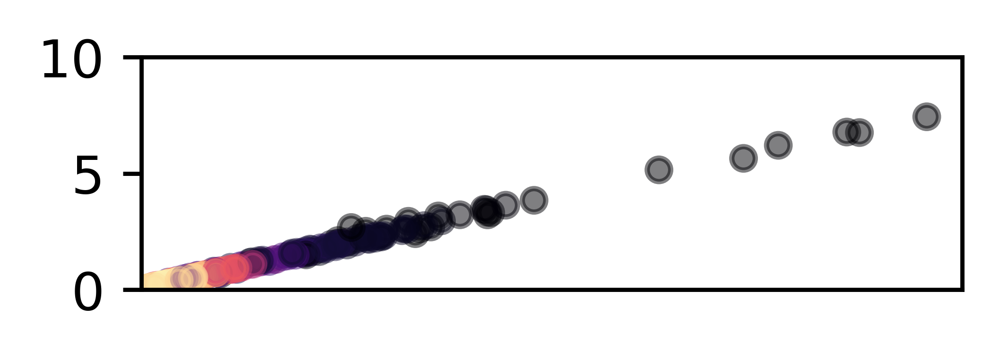

In [35]:
from scipy.stats import gaussian_kde
df_true_sample = pd.DataFrame(visium_res2.obsm['generated_expr'].mean(axis=0))
df_pred_sample = pd.DataFrame(sc_adata.X.mean(axis=0))

plt.figure(figsize=(2.8,0.8),dpi=800)
ax = plt.gca()

xx = df_true_sample.T.to_numpy().flatten()
yy = df_pred_sample.T.to_numpy().flatten()


for gene in df_true_sample.columns:
    try:
        gene_true = df_true_sample[gene].values
        gene_pred = df_pred_sample[gene].values
        gexp_stacked = np.vstack([df_true_sample[gene].values, df_pred_sample[gene].values])

        z = gaussian_kde(gexp_stacked)(gexp_stacked)
        ax.scatter(gene_true, gene_pred, c=z, s=20, alpha=0.5,cmap='magma')
    except np.linalg.LinAlgError as e:
        pass
plt.xticks([])    
plt.xlim([0,18])    
plt.ylim([0,10])  

(0.0, 6.0)

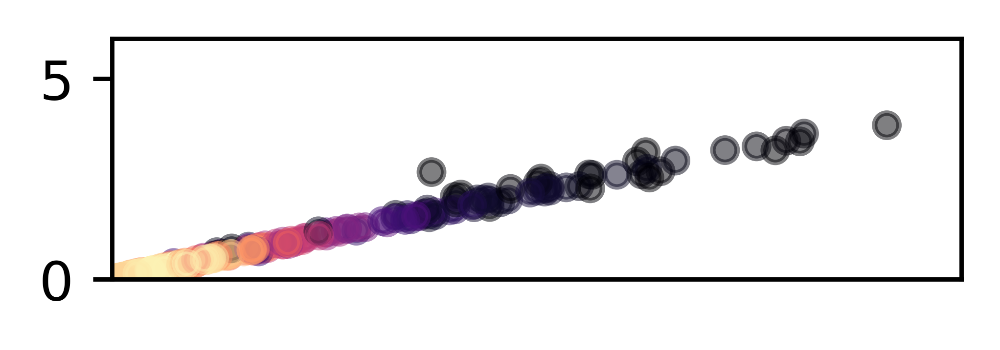

In [36]:
df_true_sample = pd.DataFrame(visium_res3.obsm['generated_expr'].mean(axis=0))
df_pred_sample = pd.DataFrame(sc_adata.X.mean(axis=0))

plt.figure(figsize=(2.8,0.8),dpi=800)
ax = plt.gca()

xx = df_true_sample.T.to_numpy().flatten()
yy = df_pred_sample.T.to_numpy().flatten()


for gene in df_true_sample.columns:
    try:
        gene_true = df_true_sample[gene].values
        gene_pred = df_pred_sample[gene].values
        gexp_stacked = np.vstack([df_true_sample[gene].values, df_pred_sample[gene].values])

        z = gaussian_kde(gexp_stacked)(gexp_stacked)
        ax.scatter(gene_true, gene_pred, c=z, s=20, alpha=0.5,cmap='magma')
    except np.linalg.LinAlgError as e:
        pass
plt.xticks([])    
plt.xlim([0,18])    
plt.ylim([0,6]) 

(0.0, 2.0)

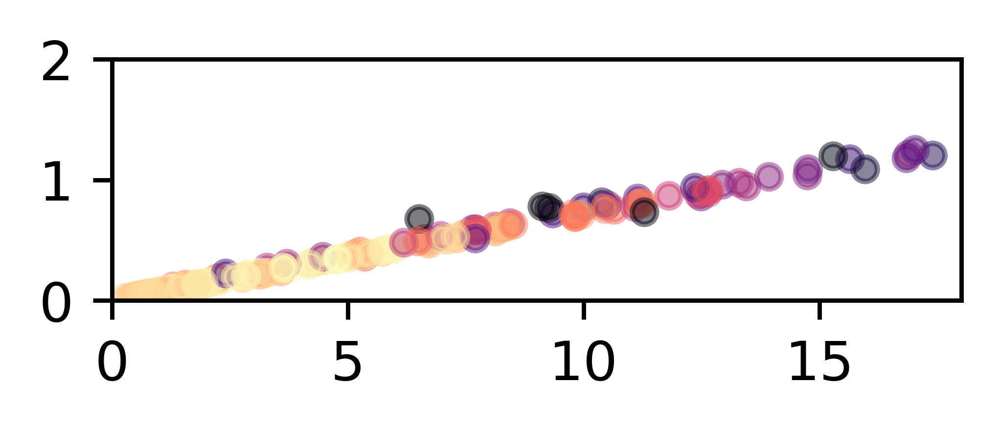

In [37]:
df_true_sample = pd.DataFrame(visium_res4.obsm['generated_expr'].mean(axis=0))
df_pred_sample = pd.DataFrame(sc_adata.X.mean(axis=0))

plt.figure(figsize=(2.8,0.8),dpi=800)
ax = plt.gca()

xx = df_true_sample.T.to_numpy().flatten()
yy = df_pred_sample.T.to_numpy().flatten()


for gene in df_true_sample.columns:
    try:
        gene_true = df_true_sample[gene].values
        gene_pred = df_pred_sample[gene].values
        gexp_stacked = np.vstack([df_true_sample[gene].values, df_pred_sample[gene].values])

        z = gaussian_kde(gexp_stacked)(gexp_stacked)
        ax.scatter(gene_true, gene_pred, c=z, s=20, alpha=0.5,cmap='magma')
    except np.linalg.LinAlgError as e:
        pass
    
plt.xlim([0,18])    
plt.ylim([0,2]) 

In [38]:
from sklearn.metrics.pairwise import cosine_similarity

cosine_sim = cosine_similarity(
    visium_res1.obsm['generated_expr'].mean(axis=0).reshape(1, -1),
    sc_adata.X.mean(axis=0).reshape(1, -1)
)[0][0]
print(f"Cosine Similarity: {cosine_sim}")

Cosine Similarity: 0.9981626868247986


In [39]:
from sklearn.metrics.pairwise import cosine_similarity

cosine_sim = cosine_similarity(
    visium_res2.obsm['generated_expr'].mean(axis=0).reshape(1, -1),
    sc_adata.X.mean(axis=0).reshape(1, -1)
)[0][0]
print(f"Cosine Similarity: {cosine_sim}")

Cosine Similarity: 0.9990552663803101


In [40]:
from sklearn.metrics.pairwise import cosine_similarity

cosine_sim = cosine_similarity(
    visium_res3.obsm['generated_expr'].mean(axis=0).reshape(1, -1),
    sc_adata.X.mean(axis=0).reshape(1, -1)
)[0][0]
print(f"Cosine Similarity: {cosine_sim}")

Cosine Similarity: 0.9983487129211426


In [41]:
from sklearn.metrics.pairwise import cosine_similarity

cosine_sim = cosine_similarity(
    visium_res4.obsm['generated_expr'].mean(axis=0).reshape(1, -1),
    sc_adata.X.mean(axis=0).reshape(1, -1)
)[0][0]
print(f"Cosine Similarity: {cosine_sim}")

Cosine Similarity: 0.9993922114372253


In [42]:
from scipy import stats
stats.pearsonr(
            visium_res1.obsm['generated_expr'].mean(axis=0),
            sc_adata.X.mean(axis=0),
           )

PearsonRResult(statistic=0.9972950383939486, pvalue=1.0232820718517678e-287)

In [43]:
from scipy import stats
stats.pearsonr(
            visium_res2.obsm['generated_expr'].mean(axis=0),
            sc_adata.X.mean(axis=0),
           )

PearsonRResult(statistic=0.9985626274652017, pvalue=2.77e-322)

In [44]:
from scipy import stats
stats.pearsonr(
            visium_res3.obsm['generated_expr'].mean(axis=0),
            sc_adata.X.mean(axis=0),
           )

PearsonRResult(statistic=0.9974554067371255, pvalue=4.676655378983452e-291)

In [45]:
from scipy import stats
stats.pearsonr(
            visium_res4.obsm['generated_expr'].mean(axis=0),
            sc_adata.X.mean(axis=0),
           )

PearsonRResult(statistic=0.9990773867735323, pvalue=0.0)

In [179]:

import os
def calculate_and_save_similarity(visium_adata, sc_adata, output_dir, prefix):
    # Ensure the output directory exists
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Initialize lists to store the results
    pearsonr_all = []
    cosine_sim_all = []
    
    # Loop over each gene/expression profile in sc_adata
    for i in range(sc_adata.X.shape[0]):
        # Pearson correlation for the ith row
        p_value, _ = pearsonr(np.array(visium_adata.obsm['generated_expr'])[i, :], np.array(sc_adata.X)[i, :])
        pearsonr_all.append(p_value)
        
        # Cosine similarity for the ith row
        cosine_sim = cosine_similarity(
            visium_adata.obsm['generated_expr'][i, :].reshape(1, -1),
            sc_adata.X[i, :].reshape(1, -1)
        )[0][0]
        cosine_sim_all.append(cosine_sim)
    
    # Save results to CSV
    pd.DataFrame(pearsonr_all).to_csv(os.path.join(output_dir, f'{prefix}_pearsonr.csv'), index=False)
    pd.DataFrame(cosine_sim_all).to_csv(os.path.join(output_dir, f'{prefix}_cosine_similarity.csv'), index=False)

# Example usage for visium_res1
calculate_and_save_similarity(visium_res1, sc_adata, '/hpc/mydata/siyu.he/HCC_project/simu_results/coral_result/', 'visium_res1')

# Example usage for visium_res2
calculate_and_save_similarity(visium_res2, sc_adata, '/hpc/mydata/siyu.he/HCC_project/simu_results/coral_result/', 'visium_res2')

# Example usage for visium_res3
calculate_and_save_similarity(visium_res3, sc_adata, '/hpc/mydata/siyu.he/HCC_project/simu_results/coral_result/', 'visium_res3')

# Example usage for visium_res4
calculate_and_save_similarity(visium_res4, sc_adata, '/hpc/mydata/siyu.he/HCC_project/simu_results/coral_result/', 'visium_res4')

/tmp/ipykernel_204474/472321228.py:73: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 100)` for the same effect.

  sns.barplot(x='Metric', y='Score', hue='Method', data=combined_long, palette=custom_palette, ci=100)


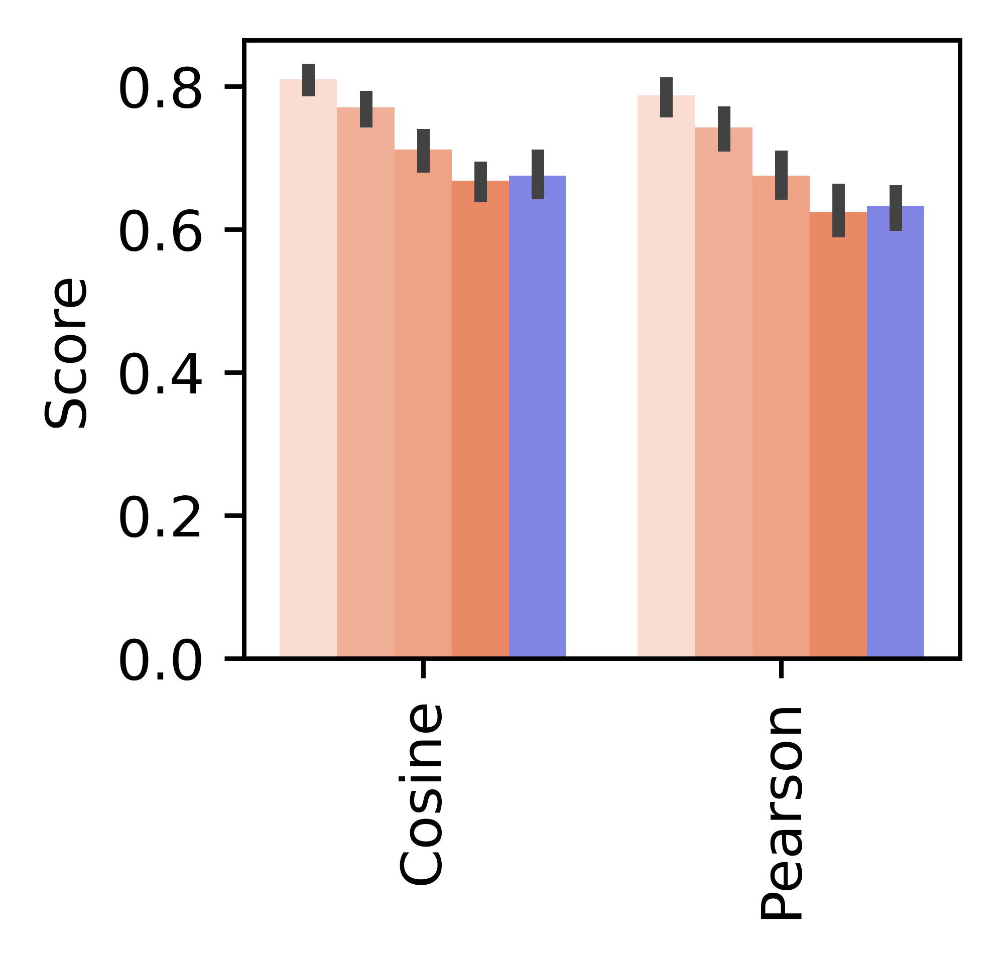

In [180]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the cosine similarity results from CSV files
visium_res1_cosine = pd.read_csv('/hpc/mydata/siyu.he/HCC_project/simu_results/coral_result/visium_res1_cosine_similarity.csv')
visium_res2_cosine = pd.read_csv('/hpc/mydata/siyu.he/HCC_project/simu_results/coral_result/visium_res2_cosine_similarity.csv')
visium_res3_cosine = pd.read_csv('/hpc/mydata/siyu.he/HCC_project/simu_results/coral_result/visium_res3_cosine_similarity.csv')
visium_res4_cosine = pd.read_csv('/hpc/mydata/siyu.he/HCC_project/simu_results/coral_result/visium_res4_cosine_similarity.csv')
scope_cosine = pd.read_csv('/hpc/mydata/siyu.he/HCC_project/simu_results/spatialscope/cosine_simulate_01.csv',index_col = 0)

visium_res1_cosine['Method'] = 'Coral_1'
visium_res2_cosine['Method'] = 'Coral_2'
visium_res3_cosine['Method'] = 'Coral_3'
visium_res4_cosine['Method'] = 'Coral_4'
scope_cosine['Method'] = 'SpatialScope'

visium_res1_cosine['Metric'] = 'Cosine'
visium_res2_cosine['Metric'] = 'Cosine'
visium_res3_cosine['Metric'] = 'Cosine'
visium_res4_cosine['Metric'] = 'Cosine'
scope_cosine['Metric'] = 'Cosine'


# Load the cosine similarity results from CSV files
visium_res1_pearson = pd.read_csv('/hpc/mydata/siyu.he/HCC_project/simu_results/coral_result/visium_res1_pearsonr.csv')
visium_res2_pearson = pd.read_csv('/hpc/mydata/siyu.he/HCC_project/simu_results/coral_result/visium_res2_pearsonr.csv')
visium_res3_pearson = pd.read_csv('/hpc/mydata/siyu.he/HCC_project/simu_results/coral_result/visium_res3_pearsonr.csv')
visium_res4_pearson = pd.read_csv('/hpc/mydata/siyu.he/HCC_project/simu_results/coral_result/visium_res4_pearsonr.csv')
scope_pearson = pd.read_csv('/hpc/mydata/siyu.he/HCC_project/simu_results/spatialscope/pearsonr_simulate_01.csv',index_col = 0)

visium_res1_pearson['Method'] = 'Coral_1'
visium_res2_pearson['Method'] = 'Coral_2'
visium_res3_pearson['Method'] = 'Coral_3'
visium_res4_pearson['Method'] = 'Coral_4'
scope_pearson['Method'] = 'SpatialScope'

visium_res1_pearson['Metric'] = 'Pearson'
visium_res2_pearson['Metric'] = 'Pearson'
visium_res3_pearson['Metric'] = 'Pearson'
visium_res4_pearson['Metric'] = 'Pearson'
scope_pearson['Metric'] = 'Pearson'

# Concatenate the results into a single DataFrame
combined_data = pd.concat([visium_res1_cosine, 
                  visium_res2_cosine, 
                  visium_res3_cosine, 
                  visium_res4_cosine,
                  scope_cosine,
                  visium_res1_pearson, 
                  visium_res2_pearson, 
                  visium_res3_pearson, 
                  visium_res4_pearson,
                  scope_pearson,
                 ])
# Melt the data for plotting
combined_long = combined_data.reset_index().melt(id_vars=['index', 'Method', 'Metric'], var_name='Variable', value_name='Score')

# Rename columns for clarity
combined_long.rename(columns={'index': 'Feature'}, inplace=True)


# Define custom color palette
            
custom_palette = {'Coral_1': '#ffdacc',
                  'Coral_2': '#ffa887',
                  'Coral_3': '#ff9b76',
                  'Coral_4': '#FF7F50',
                  'SpatialScope': '#7375f5'}

# Plot all metrics together
plt.figure(figsize=(2.3, 2), dpi=800)
sns.barplot(x='Metric', y='Score', hue='Method', data=combined_long, palette=custom_palette, ci=100)

plt.xlabel('')
plt.ylabel('Score')
plt.legend([], [], frameon=False)

#plt.legend(title='Method', bbox_to_anchor=(1.02, 1))
plt.xticks(rotation=90)
plt.show()

In [89]:
# Perform ANOVA test for each Metric
anova_results = combined_long.groupby('Metric').apply(
    lambda group: f_oneway(*[group[group['Method'] == method]['Score'].dropna() for method in custom_palette.keys()])
)

# Print ANOVA results
for metric, result in anova_results.items():
    print(f"Metric: {metric}")
    print(f"F-statistic: {result.statistic}, p-value: {result.pvalue}")
    print("---")


Metric: Cosine
F-statistic: 93.11970770317282, p-value: 2.540396187538043e-76
---
Metric: Pearson
F-statistic: 97.5262910882296, p-value: 7.644491766944572e-80
---


/tmp/ipykernel_284259/330834046.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  anova_results = combined_long.groupby('Metric').apply(


In [79]:
visium_res4.obs['annotated_type'] = truncated_codex.obs['type']

Text(0, 0.5, '')

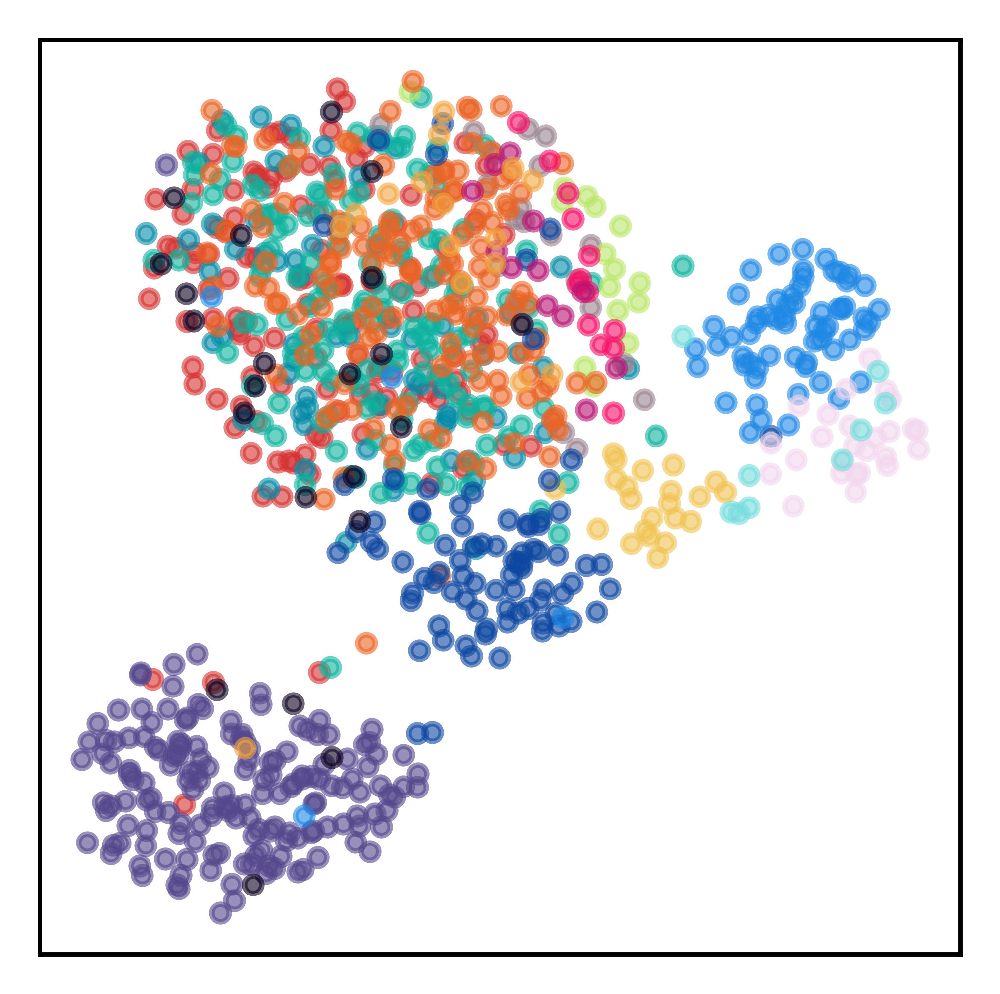

In [80]:
sc.pp.pca(truncated_codex)
sc.pp.neighbors(truncated_codex,n_neighbors=30)
sc.tl.umap(truncated_codex,min_dist=0.8)

color_list = [ '#D63230','#54478c', '#048ba8', '#0db39e', '#98838F',

              '#b9e769', 

              '#f1c453', 

              '#EB6424',
              '#0d47a1', 
              '#F61067',
              '#1e88e5',
             '#B91372',
              '#F2D7EE',
              '#75DDDD',
              '#0D0221',
             '#F2A541'
             ]

plt.subplots(1,1,figsize= (3,3),dpi=800)
for j,i in enumerate(visium_res4.obs['annotated_type'].unique()):
    plt.scatter(truncated_codex.obsm['X_umap'][visium_res4.obs['annotated_type']==i,0],
                truncated_codex.obsm['X_umap'][visium_res4.obs['annotated_type']==i,1],
                s=10,
                alpha = 0.6,
                color = color_list[j]
               )
#plt.legend(adata.obs['annotation'].unique(),bbox_to_anchor=(1.01,0.8))
plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')

Text(0, 0.5, '')

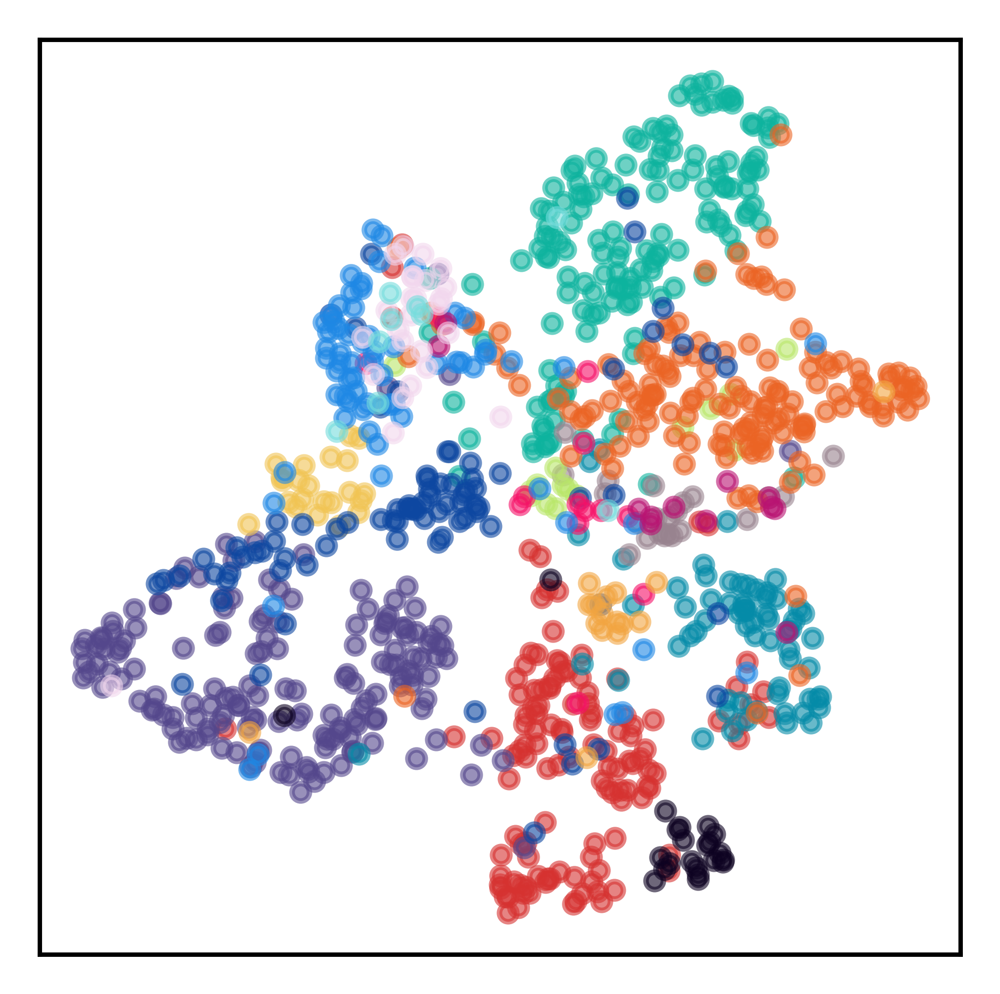

In [81]:
generated_expr_adata1 = anndata.AnnData(visium_res1.obsm['generated_expr'])
#sc.pp.normalize_total(generated_expr_adata)
#sc.pp.log1p(generated_expr_adata)
sc.pp.pca(generated_expr_adata1)
sc.pp.neighbors(generated_expr_adata1,n_neighbors=30)
sc.tl.umap(generated_expr_adata1,min_dist=0.8)


color_list = [ '#D63230','#54478c', '#048ba8', '#0db39e', '#98838F',

              '#b9e769', 

              '#f1c453', 

              '#EB6424',
              '#0d47a1', 
              '#F61067',
              '#1e88e5',
             '#B91372',
              '#F2D7EE',
              '#75DDDD',
              '#0D0221',
             '#F2A541'
             ]

plt.subplots(1,1,figsize= (3,3),dpi=800)
for j,i in enumerate(visium_res4.obs['annotated_type'].unique()):
    plt.scatter(generated_expr_adata1.obsm['X_umap'][visium_res4.obs['annotated_type']==i,0],
                generated_expr_adata1.obsm['X_umap'][visium_res4.obs['annotated_type']==i,1],
                s=10,
                alpha = 0.6,
                color = color_list[j]
               )
#plt.legend(adata.obs['annotation'].unique(),bbox_to_anchor=(1.01,0.8))
plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')

In [82]:
generated_expr_adata2 = anndata.AnnData(visium_res2.obsm['generated_expr'])
#sc.pp.normalize_total(generated_expr_adata)
#sc.pp.log1p(generated_expr_adata)
sc.pp.pca(generated_expr_adata2)
sc.pp.neighbors(generated_expr_adata2,n_neighbors=30)
sc.tl.umap(generated_expr_adata2,min_dist=0.8)

generated_expr_adata3 = anndata.AnnData(visium_res3.obsm['generated_expr'])
#sc.pp.normalize_total(generated_expr_adata)
#sc.pp.log1p(generated_expr_adata)
sc.pp.pca(generated_expr_adata3)
sc.pp.neighbors(generated_expr_adata3,n_neighbors=30)
sc.tl.umap(generated_expr_adata3,min_dist=0.8)

generated_expr_adata4 = anndata.AnnData(visium_res4.obsm['generated_expr'])
#sc.pp.normalize_total(generated_expr_adata)
#sc.pp.log1p(generated_expr_adata)
sc.pp.pca(generated_expr_adata4)
sc.pp.neighbors(generated_expr_adata4,n_neighbors=30)
sc.tl.umap(generated_expr_adata4,min_dist=0.8)


In [83]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
import numpy as np

# PCA coordinates and annotations
pca_coords_codex = truncated_codex.obsm['X_pca']
pca_coords_generated1 = generated_expr_adata1.obsm['X_pca']
pca_coords_generated2 = generated_expr_adata2.obsm['X_pca']
pca_coords_generated3 = generated_expr_adata3.obsm['X_pca']
pca_coords_generated4 = generated_expr_adata4.obsm['X_pca']
annotations = visium_res4.obs['annotated_type'].values


In [85]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import silhouette_score

# Function for intra-to-inter-cluster distance ratio
def intra_inter_distance_ratio(data, labels):
    intra_distances = []
    inter_distances = []
    unique_labels = np.unique(labels)

    for label in unique_labels:
        # Points in current cluster
        points_in_cluster = data[labels == label]
        
        # Calculate intra-cluster distance
        intra_cluster_distance = np.mean([
            np.linalg.norm(p1 - p2) 
            for i, p1 in enumerate(points_in_cluster) 
            for p2 in points_in_cluster[i+1:]
        ])
        intra_distances.append(intra_cluster_distance)
        
        # Calculate inter-cluster distance
        points_outside_cluster = data[labels != label]
        inter_cluster_distance = np.mean([
            np.linalg.norm(p1 - p2)
            for p1 in points_in_cluster
            for p2 in points_outside_cluster
        ])
        inter_distances.append(inter_cluster_distance)
    
    # Ratio of mean inter-cluster to mean intra-cluster distances
    return np.mean(inter_distances) / np.mean(intra_distances)
def bootstrap_metrics(data, labels, n_bootstrap=10):
    silhouette_scores = []
    intra_inter_ratios = []

    for _ in range(n_bootstrap):
        # Resample indices with replacement
        indices = np.random.choice(len(data), size=len(data), replace=True)
        data_resampled = data[indices]
        labels_resampled = labels[indices]

        # Calculate metrics for the resampled data
        silhouette = silhouette_score(data_resampled, labels_resampled)
        silhouette_scores.append(silhouette)
        
        intra_inter_ratio = intra_inter_distance_ratio(data_resampled, labels_resampled)
        intra_inter_ratios.append(intra_inter_ratio)
    
    return {
        'silhouette_scores': silhouette_scores,
        'intra_inter_ratios': intra_inter_ratios
    }

# Calculate metrics
pca_datasets = {
    "truncated_codex": pca_coords_codex,
    "generated_expr_adata1": pca_coords_generated1,
    "generated_expr_adata2": pca_coords_generated2,
    "generated_expr_adata3": pca_coords_generated3,
    "generated_expr_adata4": pca_coords_generated4
}

bootstrap_results = {}

for name, data in pca_datasets.items():
    results = bootstrap_metrics(data, annotations, n_bootstrap=10)
    bootstrap_results[name] = results

# Aggregate bootstrap results (e.g., mean and confidence intervals)
for name, results in bootstrap_results.items():
    silhouette_mean = np.mean(results['silhouette_scores'])
    silhouette_ci = np.percentile(results['silhouette_scores'], [2.5, 97.5])
    intra_inter_mean = np.mean(results['intra_inter_ratios'])
    intra_inter_ci = np.percentile(results['intra_inter_ratios'], [2.5, 97.5])

    print(f"{name}:")
    print(f"  Silhouette Score: {silhouette_mean:.3f} (95% CI: {silhouette_ci[0]:.3f}, {silhouette_ci[1]:.3f})")
    print(f"  Intra-to-Inter Distance Ratio: {intra_inter_mean:.3f} (95% CI: {intra_inter_ci[0]:.3f}, {intra_inter_ci[1]:.3f})")


truncated_codex:
  Silhouette Score: 0.072 (95% CI: 0.063, 0.078)
  Intra-to-Inter Distance Ratio: 1.222 (95% CI: 1.202, 1.240)
generated_expr_adata1:
  Silhouette Score: 0.112 (95% CI: 0.071, 0.138)
  Intra-to-Inter Distance Ratio: 1.514 (95% CI: 1.461, 1.581)
generated_expr_adata2:
  Silhouette Score: 0.057 (95% CI: 0.041, 0.072)
  Intra-to-Inter Distance Ratio: 1.399 (95% CI: 1.374, 1.412)
generated_expr_adata3:
  Silhouette Score: 0.006 (95% CI: -0.024, 0.034)
  Intra-to-Inter Distance Ratio: 1.372 (95% CI: 1.352, 1.390)
generated_expr_adata4:
  Silhouette Score: -0.053 (95% CI: -0.079, -0.034)
  Intra-to-Inter Distance Ratio: 1.417 (95% CI: 1.377, 1.468)


/tmp/ipykernel_284259/1170669175.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(dataset_names, rotation=45)


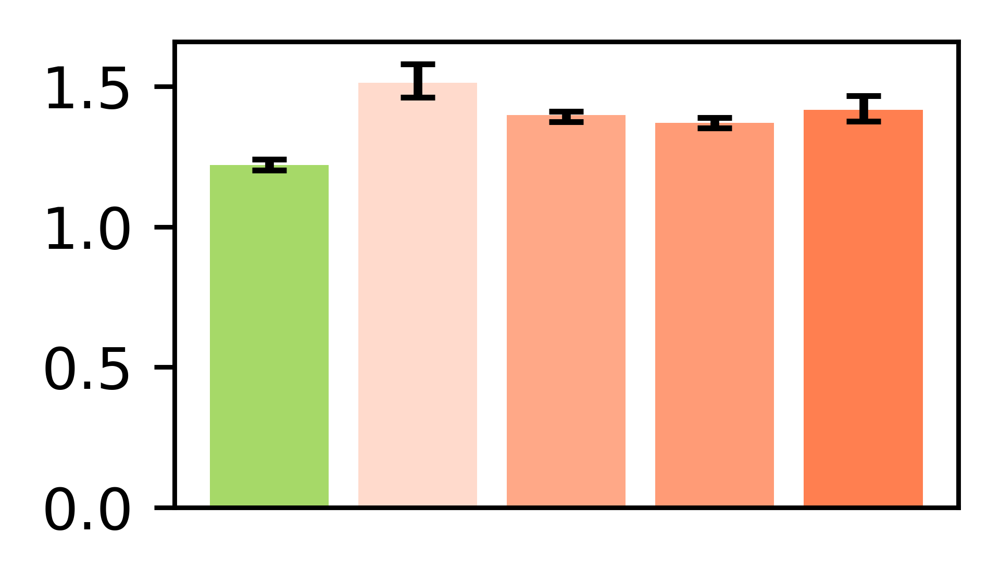

In [88]:
# Aggregate bootstrap results (e.g., mean and confidence intervals)
mean_intra_inter_ratios = []
ci_intra_inter_ratios = []

dataset_names = list(pca_datasets.keys())
bar_color = ['#a6d968', '#ffdacc', '#ffa887', '#ff9b76', '#FF7F50']

for name, results in bootstrap_results.items():
    intra_inter_mean = np.mean(results['intra_inter_ratios'])
    intra_inter_ci = np.percentile(results['intra_inter_ratios'], [2.5, 97.5])
    mean_intra_inter_ratios.append(intra_inter_mean)
    ci_intra_inter_ratios.append(intra_inter_ci)

# Plot bar chart with specified colors
fig, ax = plt.subplots(1, 1, figsize=(2.5, 1.5), dpi=800)

# Intra-to-Inter-Cluster Distance Ratio Bar Plot
ax.bar(dataset_names, mean_intra_inter_ratios, color=bar_color, yerr=[
    [mean - ci[0] for mean, ci in zip(mean_intra_inter_ratios, ci_intra_inter_ratios)],
    [ci[1] - mean for mean, ci in zip(mean_intra_inter_ratios, ci_intra_inter_ratios)]
], capsize=3)

ax.set_ylabel('Intra-to-Inter-Cluster Ratio')
ax.set_xticklabels(dataset_names, rotation=45)
plt.xticks(rotation=45)  # Adjusted for visibility
plt.ylabel('')
plt.xticks([])
plt.tight_layout()
plt.tight_layout()
plt.savefig('../figure/fig2e.pdf',dpi=600)



In [121]:
adata_coral_3 = sc.read_h5ad('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/coral_results/simulation/coral_mop_data3_new.h5ad')


In [122]:
adata_coral_3

AnnData object with n_obs × n_vars = 940 × 50
    obs: 'leiden', 'cluster'
    uns: 'leiden', 'neighbors'
    obsm: 'cell_types', 'codex_true', 'coral', 'generated_expr', 'spatial', 'v_values', 'visium_true'
    obsp: 'connectivities', 'distances'

([], [])

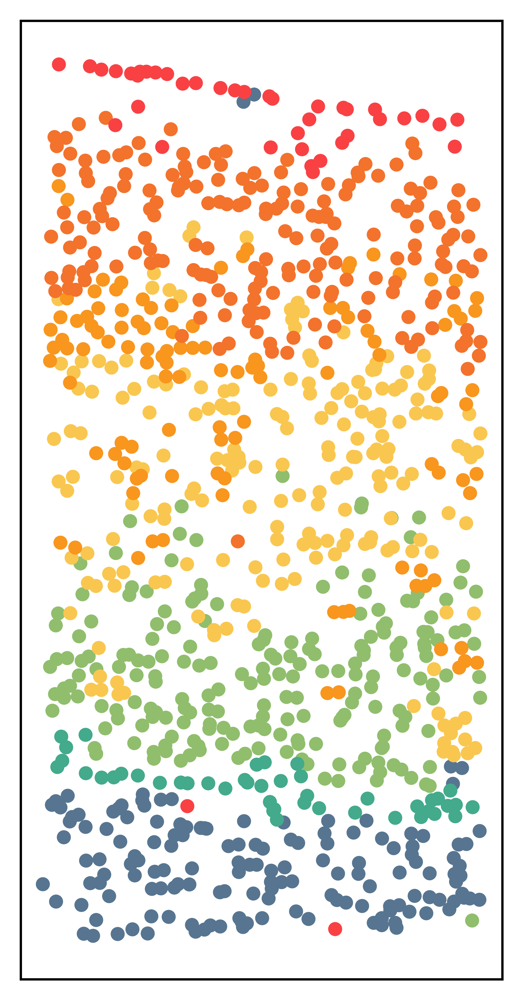

In [146]:
color_list = [
                            
                            '#90be6d',
                            '#577590',  
                            
                            '#f9c74f',
                            '#f8961e',
                            '#43aa8b',
                            '#f3722c',
                            '#f94144',
                           
                                         
                     ]
fig, ax = plt.subplots(1,1,figsize=(3,6),dpi=800)
for j,i in enumerate(adata_coral_3.obs['cluster'].unique()):
    plt.scatter(adata_coral_3.obsm['spatial'][adata_coral_3.obs['cluster']==i,0],
                adata_coral_3.obsm['spatial'][adata_coral_3.obs['cluster']==i,1],
                s=15,
                color = color_list[j]
               )

#plt.legend(adata_coral_3.obs['cluster'].unique(),
#           bbox_to_anchor=(1.01,0.8),
#           prop={'size': 10} ,
#           markerscale=5
#          )


plt.gca().invert_yaxis()
plt.xticks([])
plt.yticks([])  
#plt.axis('off')

In [161]:
def reindex_adata_qz(adata: anndata.AnnData, adata_qz: anndata.AnnData) -> anndata.AnnData:
    """
    Reindex adata_qz to match the order of adata based on spatial coordinates.

    Parameters:
    - adata: AnnData object containing the reference spatial coordinates.
    - adata_qz: AnnData object to be reindexed based on spatial coordinates.

    Returns:
    - adata_qz_reindexed: Reindexed AnnData object.
    """

    # Extract spatial coordinates
    spatial_coords_adata = adata.obsm['spatial']
    spatial_coords_adata_qz = adata_qz.obsm['spatial']

    # Find nearest neighbors
    tree = cKDTree(spatial_coords_adata_qz)
    distances, indices = tree.query(spatial_coords_adata)

    # Reindex adata_qz
    adata_qz_reindexed = adata_qz[indices].copy()
    adata_qz_reindexed.obs.index = adata.obs.index

    return adata_qz_reindexed

adata_model_gener_reindexed = reindex_adata_qz(truncated_codex, adata_coral_3)
adata_model_gener_reindexed.obs['annotated_type'] = truncated_codex.obs['type']

In [207]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

annotation_column = 'annotated_type'  # Replace with the actual name of your annotation column
adata_model_gener_reindexed.obs['annotated_type'] = truncated_codex.obs['type'].values
# Step 1: Bin the qv values into equal-width bins
adata_model_gener_reindexed.obs['qv_bin'] = pd.qcut(adata_model_gener_reindexed.obsm['v_values'].flatten(), q=10)  # Adjust q for the number of bins

# Step 2: Calculate the percentage of each annotation in each bin
percentage_df = (
    adata_model_gener_reindexed.obs.groupby(['qv_bin', annotation_column])
    .size()
    .reset_index(name='count')
    .pivot(index='qv_bin', columns=annotation_column, values='count')
)

percentage_df = percentage_df.div(percentage_df.sum(axis=1), axis=0) * 100

color_list = ['#0436bf',
              '#440587',
              '#04bdde',
              '#fc6d00',
              '#cfcd88',
              '#7abd1c',
              '#bf0404',
              '#b2ed4c',
              '#fc5b5b',
              '#5ae89f',
              '#fcd200',
              '#73022f',
              '#d2cbd4',
              '#eeb8ff',
              '#bf02e0',
              '#038c3a'
             ]
color_list = [ '#D63230','#54478c', '#048ba8', '#0db39e', '#98838F',
                  
                  '#b9e769', 
                  
                  '#f1c453', 
                  
                  '#EB6424',
                  '#0d47a1', 
                  '#F61067',
                  '#1e88e5',
                 '#B91372',
                  '#F2D7EE',
                  '#75DDDD',
                  '#0D0221',
                 '#F2A541'
                 ]
color_mapping = {atype: color_list[i] for i, atype in enumerate(truncated_codex.obs['type'].unique())}



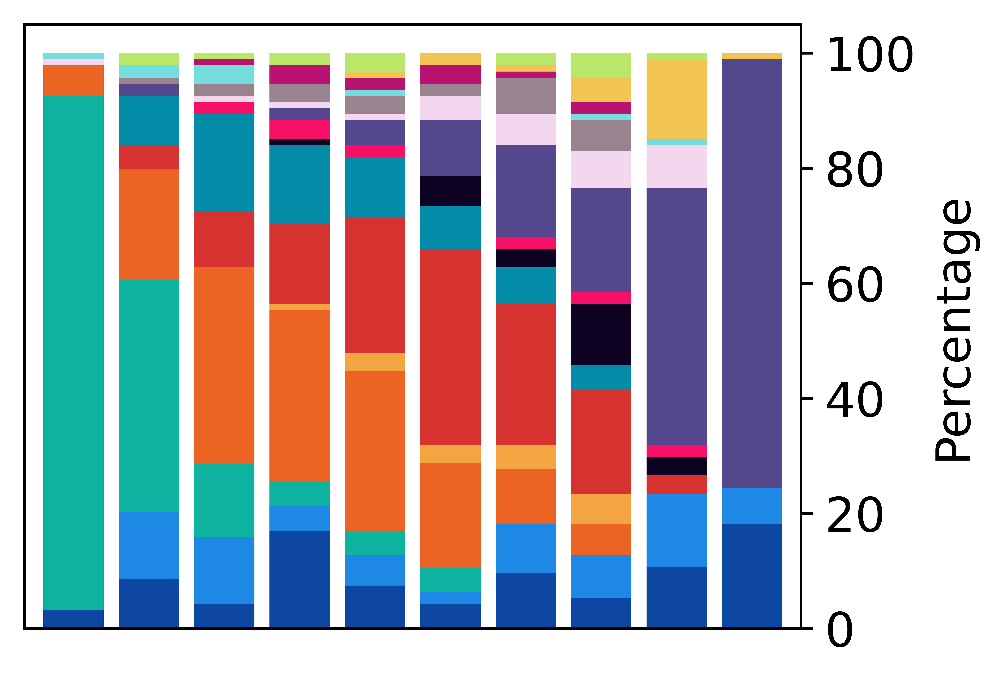

In [245]:
fig, ax = plt.subplots(figsize=(4.3, 3), dpi=800)

# Plot the data
percentage_df.plot(kind='bar', stacked=True, color=[color_mapping[col] for col in percentage_df.columns], width=0.8, ax=ax)

# Move y-axis to the right
ax.yaxis.set_label_position("right")
ax.yaxis.tick_right()

# Customize the plot
plt.title('')
ax.set_xlabel('')
ax.set_ylabel('Percentage')
ax.get_legend().remove()
#plt.legend(title='Annotation', bbox_to_anchor=(1.3, 1), loc='upper left')
plt.xticks([])
ax.grid(False)
plt.tight_layout()
plt.show()

In [221]:
percentage_df

annotated_type,Astro,Endo,L2/3 IT,L5 IT,L5 NP,L6 CT,L6 IT,L6b,Lamp5,Oligo,Peri,Pvalb,SMC,Sst,VLMC,Vip
qv_bin,,,,,,,,,,,,,,,,
"(-2.335, -1.006]",3.191489,0.000000,89.361702,5.319149,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.063830,0.000000,1.063830,0.000000,0.000000,0.000000
"(-1.006, -0.589]",8.510638,11.702128,40.425532,19.148936,0.000000,4.255319,8.510638,0.000000,0.000000,2.127660,0.000000,1.063830,2.127660,0.000000,0.000000,2.127660
"(-0.589, -0.335]",4.255319,11.702128,12.765957,34.042553,0.000000,9.574468,17.021277,0.000000,2.127660,0.000000,1.063830,2.127660,3.191489,1.063830,0.000000,1.063830
"(-0.335, -0.109]",17.021277,4.255319,4.255319,29.787234,1.063830,13.829787,13.829787,1.063830,3.191489,2.127660,1.063830,3.191489,0.000000,3.191489,0.000000,2.127660
"(-0.109, 0.0882]",7.446809,5.319149,4.255319,27.659574,3.191489,23.404255,10.638298,0.000000,2.127660,4.255319,1.063830,3.191489,1.063830,2.127660,1.063830,3.191489
"(0.0882, 0.303]",4.255319,2.127660,4.255319,18.085106,3.191489,34.042553,7.446809,5.319149,0.000000,9.574468,4.255319,2.127660,0.000000,3.191489,2.127660,0.000000
"(0.303, 0.536]",9.574468,8.510638,0.000000,9.574468,4.255319,24.468085,6.382979,3.191489,2.127660,15.957447,5.319149,6.382979,0.000000,1.063830,1.063830,2.127660
"(0.536, 0.92]",5.319149,7.446809,0.000000,5.319149,5.319149,18.085106,4.255319,10.638298,2.127660,18.085106,6.382979,5.319149,1.063830,2.127660,4.255319,4.255319
"(0.92, 1.948]",10.638298,12.765957,0.000000,0.000000,0.000000,3.191489,0.000000,3.191489,2.127660,44.680851,7.446809,0.000000,1.063830,0.000000,13.829787,1.063830


In [242]:
sc_adata = sc.read_h5ad('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/spatial_scope_data/simulate_01/merfish_data.h5ad')
generated_expr_adata = anndata.AnnData(
    adata_model_gener_reindexed.obsm['generated_expr']
)
generated_expr_adata.var_names = sc_adata.var_names
generated_expr_adata.obs['qv_bin'] = adata_model_gener_reindexed.obs['qv_bin'].astype('str').astype('category').values


generated_expr_adata.layers["scaled"] = sc.pp.scale(generated_expr_adata, copy=True).X
#sc.pp.normalize_total(generated_expr_adata, target_sum=1e4)
sc.pp.log1p(generated_expr_adata)
# Perform differential expression analysis
sc.tl.rank_genes_groups(generated_expr_adata, groupby='qv_bin', method='wilcoxon')

desired_order = list(percentage_df.index.astype('str')) # Replace with your specific group order
generated_expr_adata.obs['qv_bin'] = generated_expr_adata.obs['qv_bin'].cat.reorder_categories(desired_order, ordered=True)
generated_expr_adata.obs['qv_bin'].cat.set_categories(desired_order, ordered=True, inplace=True)

#new_categories = [str(i+1) for i in range(len(generated_expr_adata.obs['qv_bin'].cat.categories))]

# Map the old categories to the new labels
#generated_expr_adata.obs['qv_bin'] = generated_expr_adata.obs['qv_bin'].cat.rename_categories(new_categories)



/tmp/ipykernel_585984/1453134656.py:17: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  generated_expr_adata.obs['qv_bin'].cat.set_categories(desired_order, ordered=True, inplace=True)


In [ ]:
import scanpy as sc
import numpy as np
sc.set_figure_params(dpi=800, color_map="viridis_r")
sc.settings.verbosity = 0
sc.logging.print_header()
# Step 1: Run the differential expression analysis
sc.tl.rank_genes_groups(generated_expr_adata, groupby='qv_bin', method='wilcoxon')

# Step 2: Extract top genes for each group in the specified order
top_genes = []
for group in desired_order:
    genes = generated_expr_adata.uns['rank_genes_groups']['names'][group][:3]  # Top 3 genes per group
    top_genes.extend(genes)

# Step 3: Plot the heatmap with genes in the correct order
sc.pl.heatmap(
    generated_expr_adata,
    var_names=top_genes,
    groupby='qv_bin',
    use_raw=False,
    swap_axes=True,
    vmin=-2,
    vmax=2,
    cmap="magma",
    layer="scaled",
    figsize=(5.5, 5.5),
    show=False
)


scanpy==1.10.1 anndata==0.10.7 umap==0.5.6 numpy==1.26.0 scipy==1.13.0 pandas==1.5.3 scikit-learn==1.5.0 statsmodels==0.14.2 igraph==0.11.5 pynndescent==0.5.12


{'heatmap_ax': <Axes: >, 'groupby_ax': <Axes: xlabel='qv_bin'>}